In [ ]:
#CD4+T_scRNA-seq_DataAnalysis_Pipeline

In [14]:
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg, NavigationToolbar2TkAgg
import matplotlib
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
import seaborn as sns
import os
import sys
import scipy.stats
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from compiler.ast import flatten
from sklearn.neighbors import NearestNeighbors
from itertools import groupby
import math
import networkx as nt
import gc
import psutil
import scipy.stats


In [15]:
def GetBarcode(F):
    B0=list(pd.read_table(F,index_col=0).index)
    return B0
def ReadTable(Infile):return pd.read_table(Infile,sep='\t',index_col=0)

def Mkdir(DirX):
    if not os.path.exists(DirX):
        os.mkdir(DirX)
        
def SaveTable(DF,FileName):
    DF.to_csv(FileName,sep='\t')
        
def Filter(DF,label,List):
    J=DF[list(DF)[0]]>10000000000
    for i in List:
        J=J|(DF[label]==i)
    return DF[J]

def TransDemuxlet(DemuxletFO,DemuxletF,Dict,ColorDict,label):
    DemxDF=pd.read_table(DemuxletFO,sep='\t',index_col=0)
    Index=[i.split('-')[0] for i in DemxDF.index]
    def getSample(x):
        X=x.split('-')
        if X[0]=='SNG':
            return Dict[X[1]]
        else:
            return X[0]
    SampleName=map(getSample,DemxDF['BEST'])
    DemxDFNew=pd.DataFrame({'SampleName':SampleName},index=Index)
    DemxDFNew['SampleColor']=[ColorDict[i] for i in DemxDFNew['SampleName']]
    DemxDFNew.to_csv(DemuxletF,sep='\t')
    DemxDFNew.index=[i+'-'+label for i in list(DemxDFNew.index)]
    return DemxDFNew

def p_adjust_bh(p):
    p = np.asfarray(p)
    by_descend = p.argsort()[::-1]
    by_orig = by_descend.argsort()
    steps = float(len(p)) / np.arange(len(p), 0, -1)
    q = np.minimum(1, np.minimum.accumulate(steps * p[by_descend]))
    return q[by_orig]

def Get_FDR(PSeries):
    return pd.Series(p_adjust_bh(PSeries.values),index=PSeries.index)

def Ttest(A,B,Index_List):
    return pd.Series(scipy.stats.ttest_ind(A,B,axis=1)[1],index=Index_List)
    

# input A/B is DataFrame whose value is after taking log2
def Diff_FDR(A,B,fdc,fdr):
    Indexs=list(set(list(A[(A==0).apply(sum,axis=1)<len(A.columns)].index)+list(B[(B==0).apply(sum,axis=1)<len(B.columns)].index)))
    A2=A.loc[Indexs]
    B2=B.loc[Indexs]
    MeanA=A2.apply(np.mean,axis=1)
    MeanB=B2.apply(np.mean,axis=1)
    FDC=MeanA-MeanB
    Pval=Ttest(A2,B2,Indexs)
    FDR=pd.Series(p_adjust_bh(Pval.values), index=Indexs)
    return FDC,FDR,list(A2[(FDC>fdc)&(FDR<fdr)].index),list(A2[(FDC<-fdc)&(FDR<fdr)].index)
    

def Diff_Pval(A,B,fdc,p):
    Indexs=list(set(list(A[(A==0).apply(sum,axis=1)<len(A.columns)].index)+list(B[(B==0).apply(sum,axis=1)<len(B.columns)].index)))           
    A2=A.loc[Indexs]
    B2=B.loc[Indexs]
    MeanA=A2.apply(np.mean,axis=1)
    MeanB=B2.apply(np.mean,axis=1)
    FDC=MeanA-MeanB
    Pval=Ttest(A2,B2,Indexs)
    return FDC,Pval,list(A2[(FDC>fdc)&(Pval<p)].index),list(A2[(FDC<-fdc)&(Pval<p)].index)
    
    

In [16]:
#input file
inDir='./scRNA-seq/SourceData/CD4T'
outDir="./scRNA-seq/OutPut/CD4T"
RobustDir="./scRNA-seq/SourceData/CD4T/Cluster_Robustness"    


#MetaDF
MetaData=os.path.join(inDir,"MetaData.txt")                                                      

#Norm Expression            
DATA=os.path.join(inDir,"Aggr3.dataNorm.txt")

#SAVER Expression
SAVER=os.path.join(inDir,"Aggr3.dataSAVER.txt")

#Signature Gene Sets
SigDir="./ATAC-seq/"
Signature=os.path.join(SigDir, "SourceData/SignatureGenes.txt")
Signature_KEGG=os.path.join(SigDir, "SourceData/KEGGSignatureGenes.txt")
Signature_MSig=os.path.join(SigDir, "SourceData/MSigSignatureGenes.txt")

#Tnaive Tcm Tem Array Expression
TExp=os.path.join(SigDir, "SourceData/GSE61697_Tnaive_Tcm_Tem.GeneExp.txt")

#Cytokins
CytokinsFile=os.path.join(SigDir, "SourceData/CytokineRegistry.November_2015.txt")

PropFile=os.path.join(inDir, "Cellsubtype_Proportion.txt")


In [24]:
MetaDF=ReadTable(MetaData)
MetaDF['Count']=[1]*len(MetaDF)


In [25]:
MetaDF.groupby('Cluster')['Count'].apply(sum,axis=0)<len(MetaDF)*0.005


Cluster
0     False
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16     True
17     True
Name: Count, dtype: bool

In [26]:
#Remove cells in cluser 16 and 17
MetaDF=MetaDF[(MetaDF['Cluster']!=16) & (MetaDF['Cluster']!=17)]


In [27]:
BachColorsDict={'Norm':'darkblue','SLE1':'coral','SLE2':'firebrick'}
SLE2ColorsDict={'P201':'#FDD4C4','P198':'#F7997E','P205':'#F2674C','P208':'#CC252D','DBL':'lightgray','AMB':'lighgray'}
SLE1ColorsDict={'PS40':'#DBEDD8','PS51':'#B4DCB6','PS50':'#86CA93','PS37':'#4AAF6B','PS38':'#26904F','PS43':'#26664F','DBL':'lightgray','AMB':'lightgray'}
NormColorsDict={'DFS26':'#E8ECF7','DFS28':'#C6DDED','DFS29':'#90C2DB','DFS31':'#68ADD2','DMS27':'#4891C4','DMS30':'#2677B6','DBL':'lightgray','AMB':'lightgray'}
SampleColorsDict=dict(SLE2ColorsDict.items()+SLE1ColorsDict.items()+NormColorsDict.items())
SampleColorsDict['Unknown']='lightgray'
SampleOrderDAI=['DFS26','DFS28','DFS29','DFS31','DMS27','DMS30','PS40','PS51','PS50','PS37','PS38','PS43','P201','P198','P205','P208']
StateColorsDict={'N':'darkblue','S':'firebrick'}
ClusterColorsDict={0: '#A17CAF',
 1: '#D14827',
 2: '#CE6463',
 3: '#5C4595',
 4: '#F6E7AD',
 5: '#E9A6C6',
 6: '#4D8A9C',
 7: '#ACB566',
 8: '#C47DA1',
 9: '#2E60A9',
 10: '#6A8C3B',
 11: '#F9D232',
 12: '#5A77AE',
 13: '#C9B9D5',
 14: '#DE9B53',
 15: 'lightgrey',
 16: 'grey'}
SampleOrder=['DFS26',
 'DFS28',
 'DFS29',
 'DFS31',
 'DMS27',
 'DMS30',
 'PS40',
 'PS51',
 'PS50',
 'PS37',
 'PS38',
 'PS43',
 'P201',
 'P198',
 'P205',
 'P208']

ClusterOrder=[1,3,7,9,2,5,0,6,14,4,11,8,10,13,12,15]



# Batch QC 

In [41]:
Dir=os.path.join(outDir,'Batch_QC')
if not os.path.exists(Dir):
    os.mkdir(Dir)


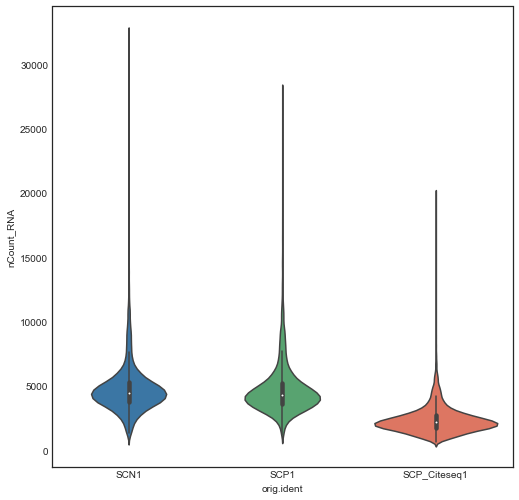

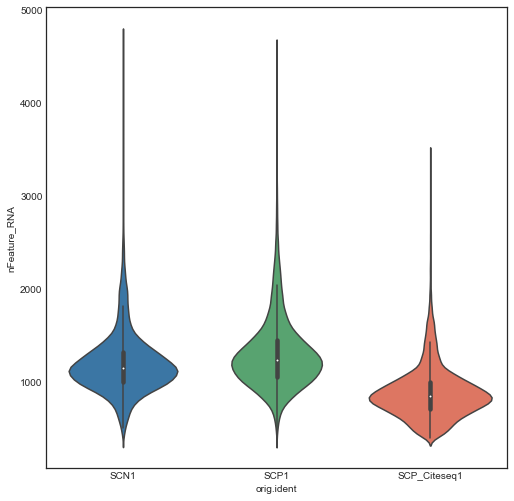

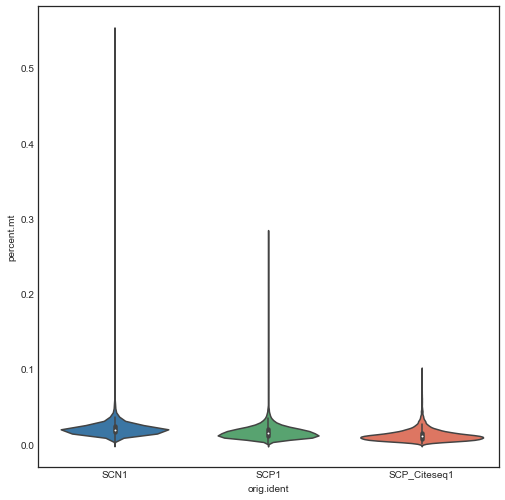

In [42]:
BatchDict={'SCN1':'#2978B6','SCP1':'#4BAF6B','SCP_Citeseq1':'#F1684D'}

plt.style.use('seaborn-white')
fig=plt.figure(figsize=(8,8))
ax=fig.add_axes([0.15,0.15,0.8,0.8])
sns.violinplot(x="orig.ident", y="nCount_RNA", data=MetaDF,ax=ax,palette=BatchDict)
fig.savefig(os.path.join(Dir, 'nCount_RNA.pdf'))
plt.show()

plt.style.use('seaborn-white')
fig=plt.figure(figsize=(8,8))
ax=fig.add_axes([0.15,0.15,0.8,0.8])
sns.violinplot(x="orig.ident", y="nFeature_RNA", data=MetaDF,ax=ax,palette=BatchDict)
fig.savefig(os.path.join(Dir, 'orig.ident.pdf'))
plt.show()

plt.style.use('seaborn-white')
fig=plt.figure(figsize=(8,8))
ax=fig.add_axes([0.15,0.15,0.8,0.8])
sns.violinplot(x="orig.ident", y="percent.mt", data=MetaDF,ax=ax,palette=BatchDict)
fig.savefig(os.path.join(Dir, 'percent.mt.pdf'))
plt.show()


# Scatterplot

In [44]:
#OutDir 
Dir=os.path.join(outDir,'Celltype_Scatter')
if not os.path.exists(Dir):
    os.mkdir(Dir)


In [25]:
def Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue=None,outFilePrefix=None,hueColorDict=None,sub='AllCells',legend=True,vmin=-1,vmax=1):
    if legend:
        outfig=outFilePrefix+sub+'.ScatterPlot.for'+hue+'.pdf'
    else:
        outfig=outFilePrefix+sub+'.ScatterPlot.withoutLegend.for'+hue+'.pdf'
    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(8,8))
    ax=fig.add_axes([0.15,0.15,0.8,0.8])
    if type(hueColorDict)==str:
        if legend:
            sns.scatterplot(x=X,y=Y,data=ScatterDF,hue=hue,palette=hueColorDict,s=12,ax=ax,edgecolor='none',hue_norm=(vmin,vmax),alpha=0.8)
            ax.legend(fontsize='xx-large',markerscale=1.5,ncol=1,edgecolor='k',columnspacing=0.1,labelspacing=0.2,handletextpad=0.1)
        else:
            sns.scatterplot(x=X,y=Y,data=ScatterDF,hue=hue,palette=hueColorDict,s=12,legend=False,ax=ax,edgecolor='none',hue_norm=(vmin,vmax),alpha=0.8)
        
    elif type(hueColorDict)==dict:
        for h in hueColorDict:
            c=hueColorDict[h]
            DFsub=ScatterDF[ScatterDF[hue]==h]
            ax.scatter(DFsub[X],DFsub[Y],c=c,s=3,label=h,alpha=0.7)
        if legend:
            ax.legend(fontsize='xx-large',markerscale=8,ncol=3,edgecolor='k',columnspacing=0,labelspacing=0,handletextpad=0)
    ax.set_title(sub+'-'+hue,fontsize=20)
    ax.tick_params(axis='x',labelsize=20)
    ax.tick_params(axis='y',labelsize=20)
    ax.set_xlabel(X,fontsize=25)
    ax.set_ylabel(Y,fontsize=25)
    fig.savefig(outfig,dpi=500)
    plt.show()
    


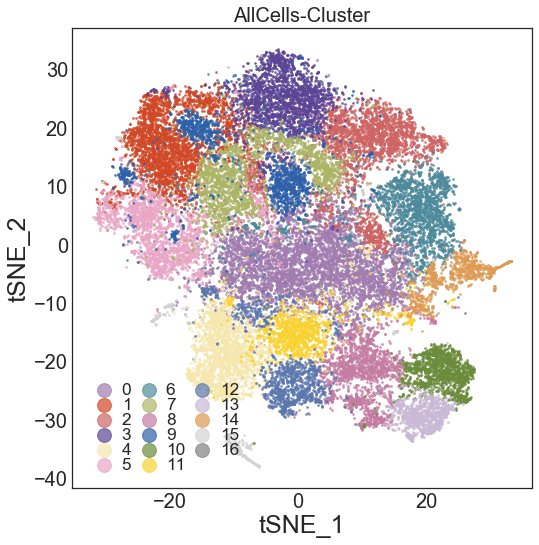

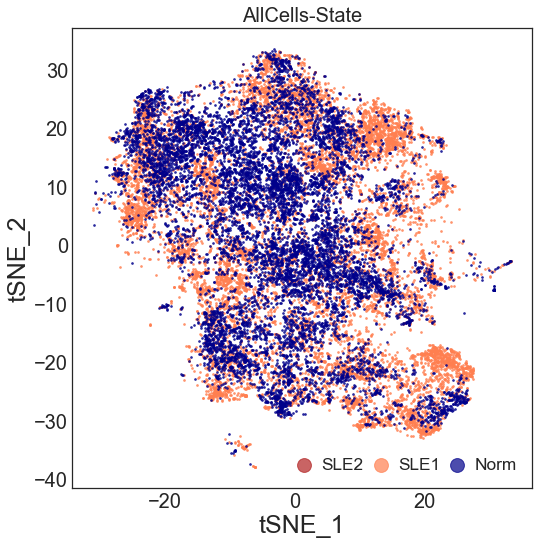

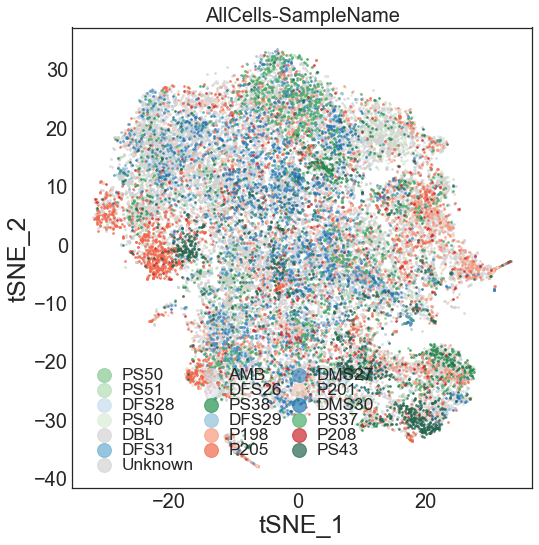

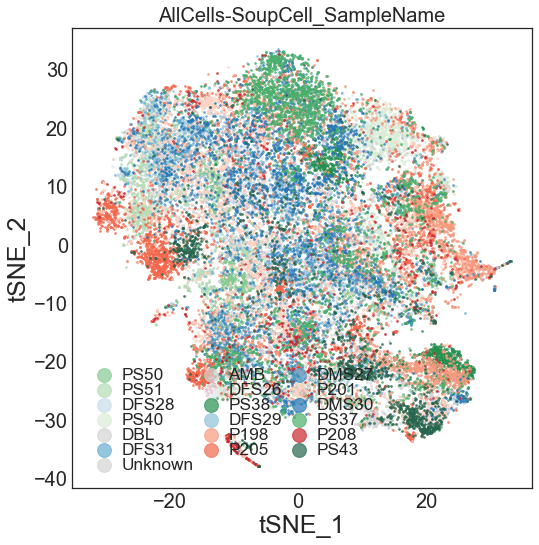

In [46]:
Scatter(hue='Cluster',hueColorDict=ClusterColorsDict,outFilePrefix=os.path.join(Dir,'AllCellScatter'))
Scatter(hue='State',hueColorDict=BachColorsDict,outFilePrefix=os.path.join(Dir,'AllCellScatter'))
Scatter(hue='SampleName',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict=SampleColorsDict,sub='AllCells') 
Scatter(hue='SoupCell_SampleName',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict=SampleColorsDict,sub='AllCells') 




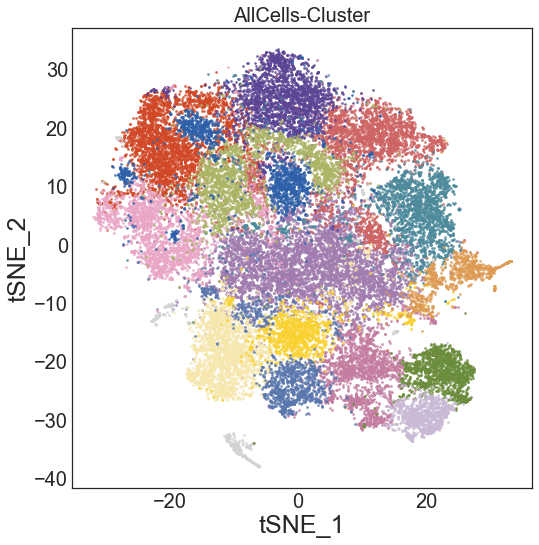

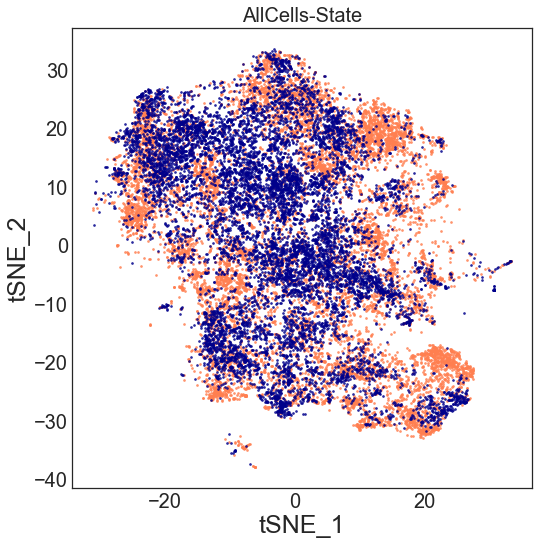

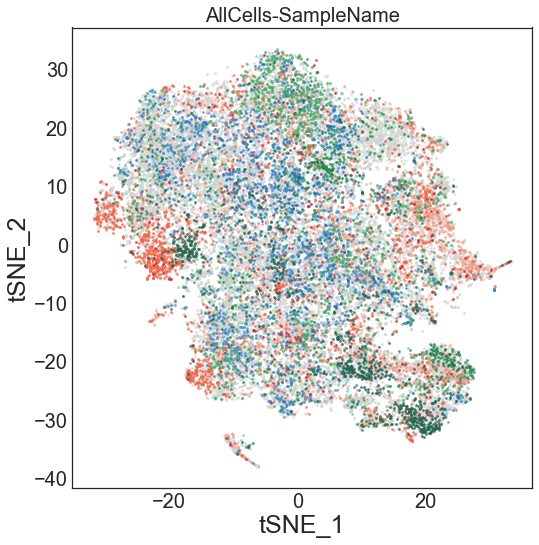

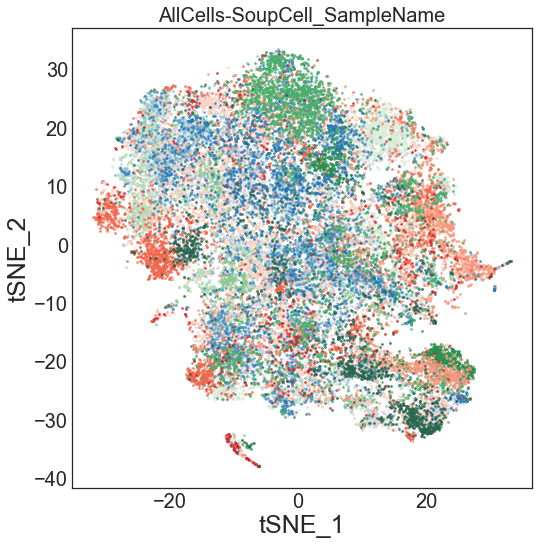

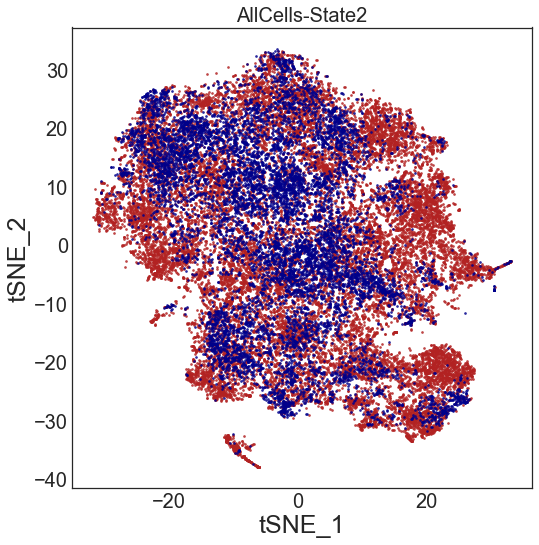

In [47]:
Scatter(hue='Cluster',hueColorDict=ClusterColorsDict,outFilePrefix=os.path.join(Dir,'AllCellScatter'),legend=False)
Scatter(hue='State',hueColorDict=BachColorsDict,outFilePrefix=os.path.join(Dir,'AllCellScatter'),legend=False)
Scatter(hue='SampleName',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict=SampleColorsDict,sub='AllCells',legend=False) 
Scatter(hue='SoupCell_SampleName',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict=SampleColorsDict,sub='AllCells',legend=False)                 
Scatter(hue='State2',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict=StateColorsDict,sub='AllCells',legend=False)                 




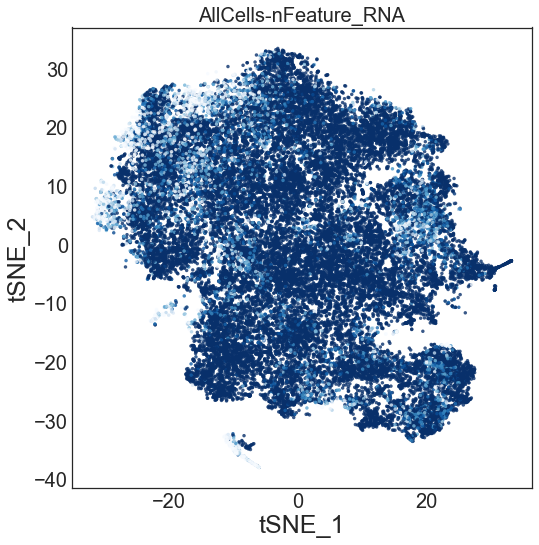

In [48]:

Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='nFeature_RNA',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict="Blues",sub='AllCells',legend=False,vmin=500,vmax=800)                              



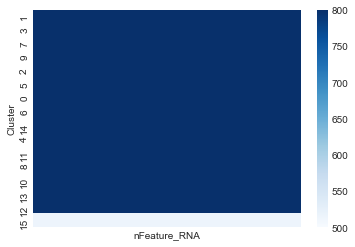

In [49]:
sns.heatmap(pd.DataFrame(MetaDF.groupby('Cluster')['nFeature_RNA'].apply(np.median,axis=0).loc[ClusterOrder]), cmap='Blues',vmin=500,vmax=800)                                    
plt.savefig(os.path.join(Dir, 'Cluster_Median_nFeature_RNA.pdf'))
plt.show()



# Cluster Robustness

In [10]:
Dir=os.path.join(outDir,'Robustness_Analysis')
if not os.path.exists(Dir):
    os.mkdir(Dir)


In [11]:
Files=[os.path.join(RobustDir, i) for i in os.listdir(RobustDir) if "Robustness." in i]
def ReadRobustFile(f):
    LabelDict={'SCN1':'-1','SCP1':'-2','SCP':'-3'}
    DF=ReadTable(f)
    DF.index=[i.split('_')[-1]+LabelDict[i.split('_')[0]] for i in DF.index]
    return DF
    
RobustDF=pd.DataFrame({},index=MetaDF.index)    
for i in range(len(Files)):
    DF=ReadRobustFile(Files[i])
    RobustDF[i]=DF.loc[MetaDF.index]['integrated_snn_res.1']


In [12]:
import random
random.seed(1)

ClusterSimDF=pd.DataFrame({},index=set(MetaDF['Cluster']),columns=set(MetaDF['Cluster']))
for c1 in set(MetaDF['Cluster']):
    for c2 in set(MetaDF['Cluster']):
        print str(c1)+'-'+str(c2)
        C1=list(MetaDF[MetaDF['Cluster']==c1].index)
        C2=list(MetaDF[MetaDF['Cluster']==c2].index)
        Dis=[]
        for cell1 in random.sample(C1, int(len(C1)/10)):
            for cell2 in random.sample(C2, int(len(C2)/10)):
                Jud=(RobustDF.loc[cell1]==RobustDF.loc[cell2])
                Dis.append(sum(Jud)/float(len(Jud)))
        ClusterSimDF[c1][c2]=np.mean(Dis)
        


0-0
0-1
0-2
0-3
0-4
0-5
0-6
0-7
0-8
0-9
0-10
0-11
0-12
0-13
0-14
0-15
1-0
1-1
1-2
1-3
1-4
1-5
1-6
1-7
1-8
1-9
1-10
1-11
1-12
1-13
1-14
1-15
2-0
2-1
2-2
2-3
2-4
2-5
2-6
2-7
2-8
2-9
2-10
2-11
2-12
2-13
2-14
2-15
3-0
3-1
3-2
3-3
3-4
3-5
3-6
3-7
3-8
3-9
3-10
3-11
3-12
3-13
3-14
3-15
4-0
4-1
4-2
4-3
4-4
4-5
4-6
4-7
4-8
4-9
4-10
4-11
4-12
4-13
4-14
4-15
5-0
5-1
5-2
5-3
5-4
5-5
5-6
5-7
5-8
5-9
5-10
5-11
5-12
5-13
5-14
5-15
6-0
6-1
6-2
6-3
6-4
6-5
6-6
6-7
6-8
6-9
6-10
6-11
6-12
6-13
6-14
6-15
7-0
7-1
7-2
7-3
7-4
7-5
7-6
7-7
7-8
7-9
7-10
7-11
7-12
7-13
7-14
7-15
8-0
8-1
8-2
8-3
8-4
8-5
8-6
8-7
8-8
8-9
8-10
8-11
8-12
8-13
8-14
8-15
9-0
9-1
9-2
9-3
9-4
9-5
9-6
9-7
9-8
9-9
9-10
9-11
9-12
9-13
9-14
9-15
10-0
10-1
10-2
10-3
10-4
10-5
10-6
10-7
10-8
10-9
10-10
10-11
10-12
10-13
10-14
10-15
11-0
11-1
11-2
11-3
11-4
11-5
11-6
11-7
11-8
11-9
11-10
11-11
11-12
11-13
11-14
11-15
12-0
12-1
12-2
12-3
12-4
12-5
12-6
12-7
12-8
12-9
12-10
12-11
12-12
12-13
12-14
12-15
13-0
13-1
13-2
13-3
13-4
13-5
13-6
13-7
13

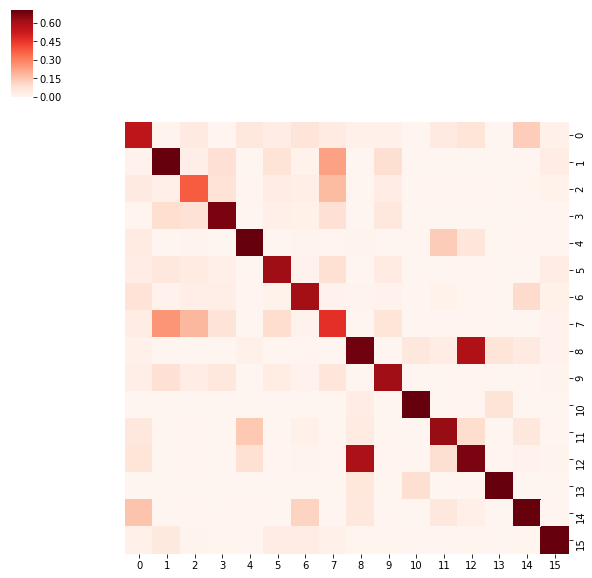

In [13]:
SaveTable(ClusterSimDF, os.path.join(RobustDir, 'ClusterSimilarity.txt'))
ClusterSimDF=ReadTable(os.path.join(RobustDir, 'ClusterSimilarity.txt'))
fig=sns.clustermap(pd.DataFrame(ClusterSimDF), cmap='Reds',vmin=0,vmax=0.7,col_cluster=False, row_cluster=False)
plt.show()
fig.savefig(os.path.join(RobustDir, 'ClusterSimilarity.pdf'))



# Cluster Ratio

In [13]:
Dir=os.path.join(outDir,'Cluster_Ratio')
if not os.path.exists(Dir):
    os.mkdir(Dir)


In [14]:
#BarPlot 
def BarPlot(DF,label,Dir,X='Complication',Y='Group',ColorsDict=None,Xcount=True,xsorthue=None,Xorder=None,ysorthue=None,Yorder=None):
    DF=DF.dropna(axis=0)
    if xsorthue:
        Samples=list(DF[xsorthue+[X]].drop_duplicates().sort_values(xsorthue)[X])
    elif Xorder:
        Samples=Xorder
    else:
        Samples=sorted(list(set(DF[X])))
    
    if ysorthue:
        AllCelltype=list(DF[ysorthue+[Y]].drop_duplicates().sort_values(ysorthue)[Y])
    elif Yorder:
        AllCelltype=Yorder
    else:
        AllCelltype=sorted(list(set(DF[Y])),reverse=True)
    
    SampleDict={}
    for i in Samples:
        SampleDict[i]=[]
        CelltypeI=list(DF[DF[X]==i][Y])
    #        print len(CelltypeI)
        for j in AllCelltype:
            SampleDict[i].append(sum([1 for s in CelltypeI if s==j])/float(len(CelltypeI)))        
    SampleList=sorted(list(DF[X]))
    WidthRate0=[sum([1 for i in SampleList if i==c])/float(len(SampleList)) for c in Samples]
    MaxWidth=max(WidthRate0)
    WidthRate=[(0.95/MaxWidth)*i for i in WidthRate0]
    
    plt.style.use('seaborn-white')
    fig1=plt.figure(figsize=(len(Samples)*0.5,4))
    ax1=fig1.add_axes([0.15,0.2,0.8,0.75])
    for i in range(len(Samples)):
        for j in range(len(AllCelltype)):
            if Xcount:
                ax1.bar([i],[SampleDict[Samples[i]][j]],width=WidthRate[i],bottom=[sum(SampleDict[Samples[i]][:j])],color=ColorsDict[AllCelltype[j]],linewidth=0.5,edgecolor='k')
            else:
                ax1.bar([i],[SampleDict[Samples[i]][j]],width=0.95,bottom=[sum(SampleDict[Samples[i]][:j])],color=ColorsDict[AllCelltype[j]],linewidth=0.5,edgecolor='k')
    plt.xticks(range(len(Samples)),tuple([str(i) for i in Samples]),fontsize=20)
    ax1.set_xticklabels(Samples,rotation='vertical')
    ax1.tick_params(labelsize=20,length=5,direction='out')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    plt.title(label,fontsize=20)
    if Xcount:
        Fig1Out=os.path.join(Dir,'{}.{}-{}.RateBarPlot.pdf'.format(label,X,Y))
    else:
        Fig1Out=os.path.join(Dir,'{}.{}-{}.RateBarPlot.withoutXcount.pdf'.format(label,X,Y))
    fig1.savefig(Fig1Out)
    plt.show()
    return pd.DataFrame(SampleDict,index=AllCelltype)


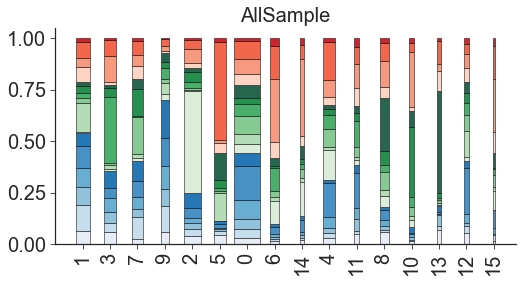

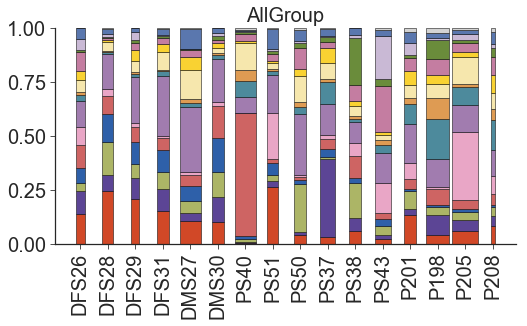

In [15]:

SampleMetaDF=MetaDF[MetaDF['SampleName']!='Unknown']
ClusterSampleRatio=BarPlot(SampleMetaDF.dropna(axis=1,how='all'),'AllSample',Dir,X='Cluster',Y='SampleName',ColorsDict=SampleColorsDict,Xcount=True,xsorthue=None,ysorthue=None,Xorder=ClusterOrder,Yorder=SampleOrder)

SampleClusterRatio=BarPlot(SampleMetaDF.dropna(axis=1,how='all'),'AllGroup',Dir,Y='Cluster',X='SampleName',ColorsDict=ClusterColorsDict,Xcount=True,xsorthue=None,Xorder=SampleOrder,ysorthue=None,Yorder=ClusterOrder)       


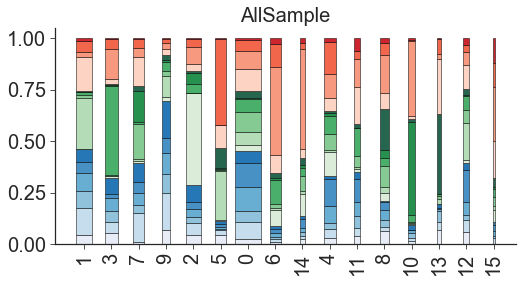

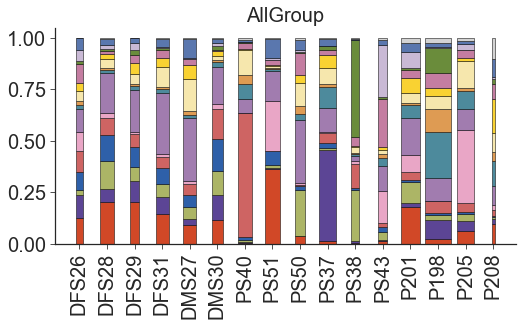

In [16]:
ClusterOrder=[1,3,7,9,2,5,0,6,14,4,11,8,10,13,12,15]
SampleMetaDF_SoupCell=MetaDF[MetaDF['SoupCell_SampleName']!='Unknown']
ClusterSampleRatio_SoupCell=BarPlot(SampleMetaDF_SoupCell.dropna(axis=1,how='all'),'AllSample',Dir,X='Cluster',Y='SoupCell_SampleName',ColorsDict=SampleColorsDict,Xcount=True,xsorthue=None,ysorthue=None,Xorder=ClusterOrder,Yorder=SampleOrder)
SampleClusterRatio_SoupCell=BarPlot(SampleMetaDF_SoupCell.dropna(axis=1,how='all'),'AllGroup',Dir,Y='Cluster',X='SoupCell_SampleName',ColorsDict=ClusterColorsDict,Xcount=True,xsorthue=None,Xorder=SampleOrder,ysorthue=None,Yorder=ClusterOrder)       



# Celltype Identity

In [17]:
Dir=os.path.join(outDir, 'Celltype_Identity')
Mkdir(Dir)


In [18]:
SignatureDF=ReadTable(Signature)
SignatureDF_KEGG=ReadTable(Signature_KEGG)
SignatureDF_MSig=ReadTable(Signature_MSig)


SignatureDict={}
for gs in list(SignatureDF):
    SignatureDict[gs]=list(SignatureDF[gs].dropna())
    

/Users/liuqian/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2821: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,2

In [19]:
Genes=['CD38','KLRB1','TBX21','TCR','IFNAR2','TIGIT','IFNAR1','CD40LG','IFNW1','PECAM1','SAMD12','RARG','IL12RB1','GADD45A','GADD45B',
 'IL12RB2','RORC','PTGER2','GADD45G','FGFBP2', 'HLA-DQB1', 'CXCR6', 'HLA-DPB1', 'CD28', 'IFNK', 'DDX3Y', 'RPS12', 'IFNG', 'HLA-DRB3',
 'TSC22D3', 'HLA-DRB1', 'CD27', 'CD25', 'IFNA2', 'CCL21', 'RPL17', 'LY6E', 'PRF1', 'CXCL13', 'GATA3', 'CTSW', 'IL21', 'XAF1','SOCS1',
 'SOCS3', 'CX3CR1', 'RPS6','EPSTI1', 'RUNX3', 'ADGRG1', 'MAF', 'IFNA1', 'CCR5', 'IL7R', 'FOXP3', 'NFATC2', 'CD2', 'CCL5', 'RTKN2',
 'RPL4', 'RPL5', 'NFKBID', 'MX1', 'CD209', 'UTS2', 'IFNGR1', 'IFNGR2', 'ICOSLG', 'IFIT3', 'TNFRSF18', 'NKG7', 'XIST', 'EGR2', 'BACH2',
 'EGR1', 'JUN', 'ISG15', 'TNFRSF9', 'HLA-DQB2', 'TNFRSF4', 'MT1E', 'MT1G', 'CTLA4', 'TCF7', 'IL4R', 'FOS', 'HLA-DPA1', 'KLRG1', 'TNFRSF1B',
 'GZMA', 'GZMB','CD274', 'GZMK', 'ITGAL', 'CREM', 'CD74', 'THEMIS', 'BATF', 'IL15R', 'FOSB', 'LAG3', 'CD4', 'CCR1', 'CCR2', 'CCR4',
 'RORA', 'CCR6', 'CCR7', 'CCR8', 'CCR9', 'IGF2R', 'IKZF2', 'STAT4', 'STAT3', 'STAT1', ' ZNF683', 'CD80', 'CD83', 'BTLA', 'IFNB1',
 'IFI44L', 'TNFSF9', 'TOX2', 'ICAM3', 'ICAM2', 'ICAM1', 'FOSL2', 'S100A4', 'PDCD1', 'IL17F', 'IL17A', 'CD69', 'IL6R', 'LTB', 'CD70',
 'CD8A', 'LGALS1', 'IL2RA', 'IL2RB', 'IL2RG', 'IL10', 'CCL19', 'IL12', 'ID2', 'IFNA6', 'IFNA4', 'CD86', 'IL4', 'IL2', 'HLA-DOA', 'HLA-DOB',
 'NFATC1', 'SLAMF6', 'TNFSF4', 'RPS13','TGFB1', 'MT2A', 'CD57', 'IL23A', 'CD58', 'JUNB', 'FOXO3', 'ICOS', 'CTNNB1', 'FOXO1', 'IL23R', 'SOX6', 
 'SOX4', 'SOX5', 'HLA-DRA', 'TOB1', 'FYN', 'CXCR3', 'KLF2', 'CXCR5', 'CXCR4', 'GNLY', 'PRDM1', 'ITGB1', 'CD244', 'ITGB2', 'JUND',
 'CD44', 'NR4A1', 'CD40','CD40L', 'IL35', 'HLA-DRB4', 'PDCD1LG2', 'HLA-DRB5', 'SELL', 'BCL6', 'CCR10', 'PTPRC', 'HLA-DQA2', 'IFI44',
 'HLA-DMB', 'HLA-DQA1', 'HAVCR2', 'HLA-DMA','LKB1']
for gs in SignatureDF.columns:
    Genes=Genes+list(SignatureDF[gs].dropna())
Genes=list(set(Genes))



In [23]:
Dir_Seurat=os.path.join(Dir,'MarkerGeneExpression_Seurat')
Dir_Saver=os.path.join(Dir,'MarkerGeneExpression_SAVER')
Mkdir(Dir_Seurat)
Mkdir(Dir_Saver)


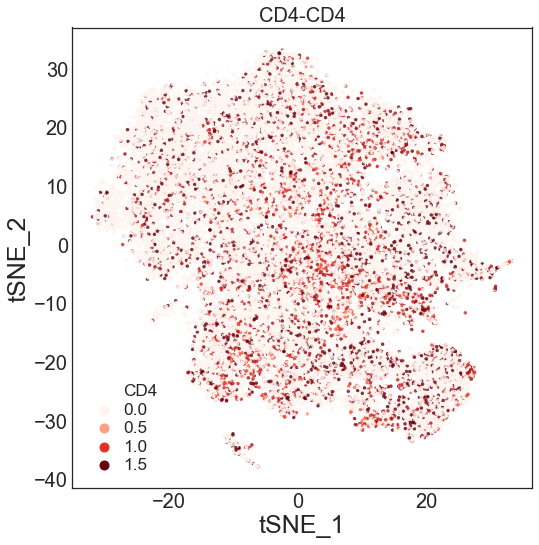

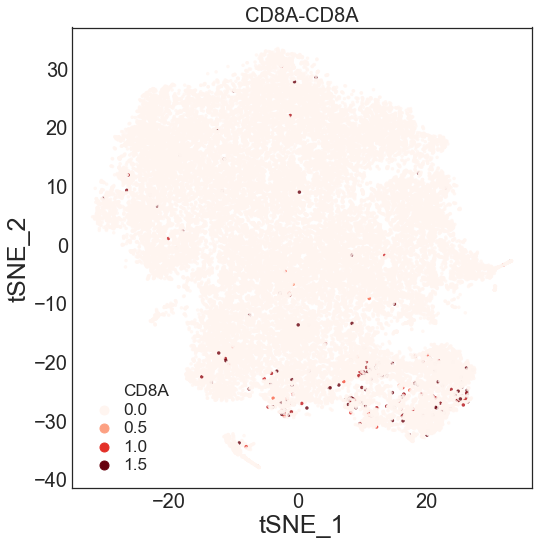

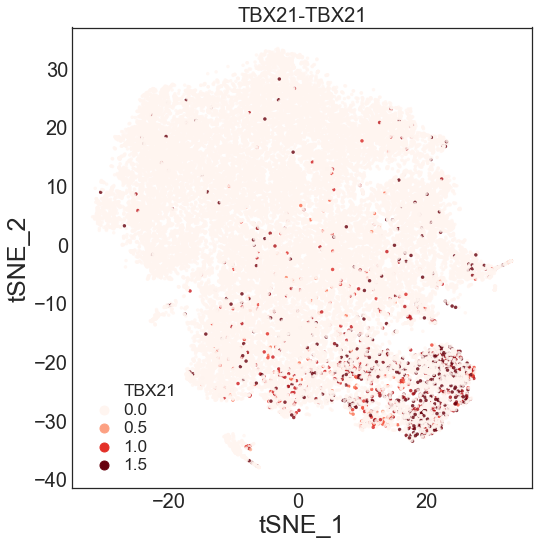

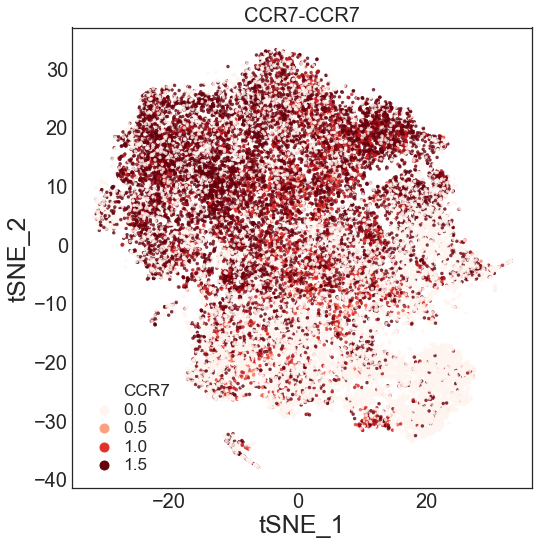

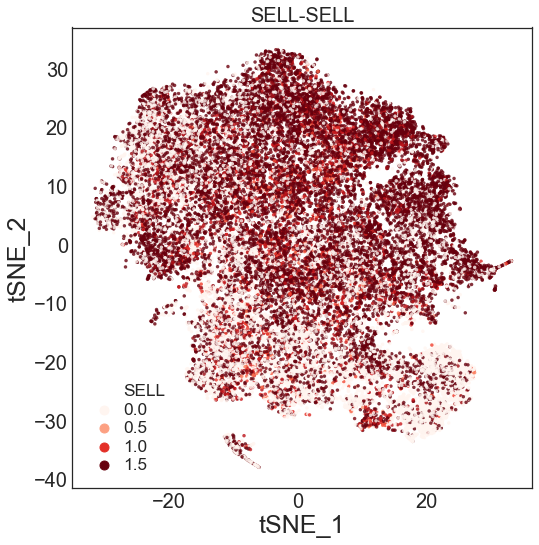

...

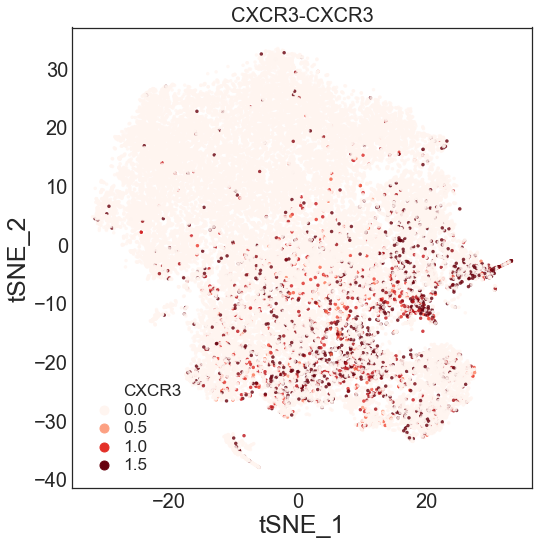

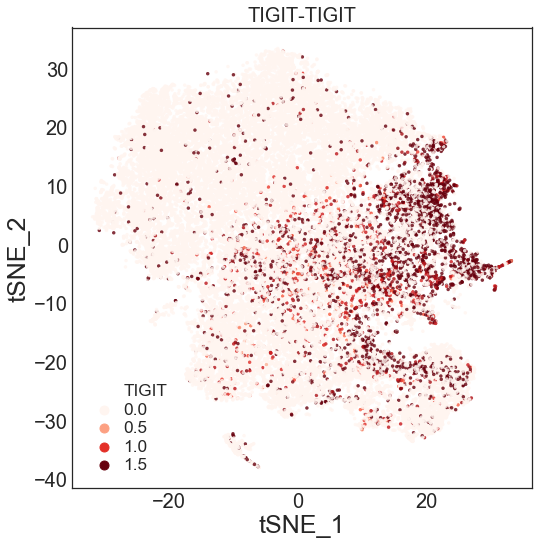

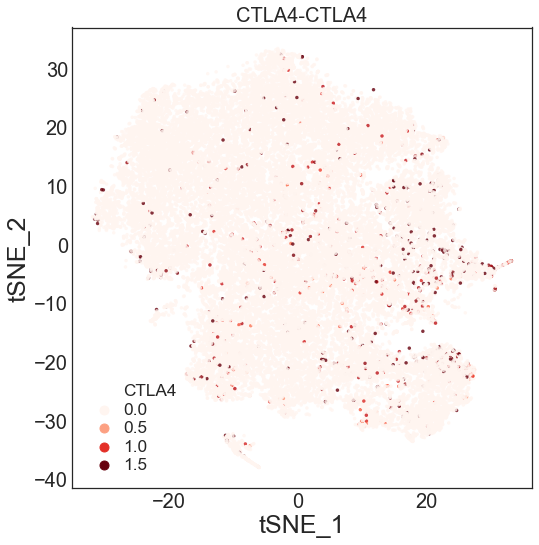

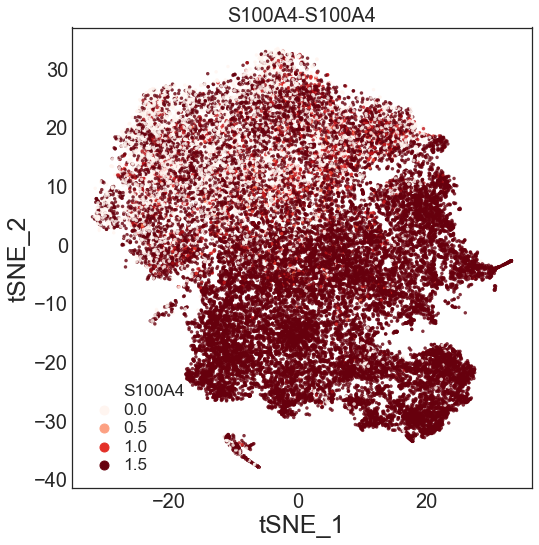

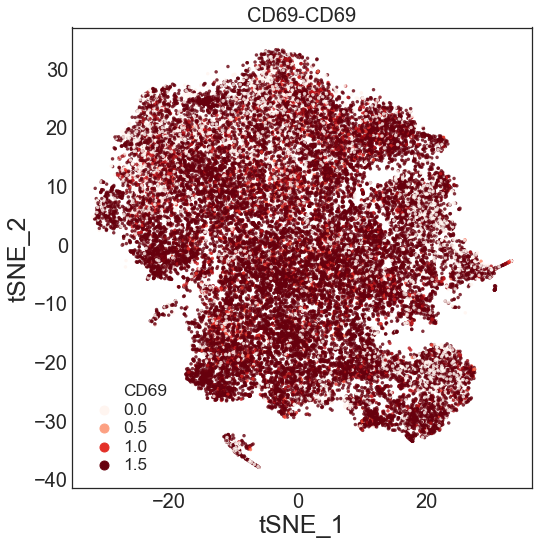

In [26]:
#Gene Expression
subExpDFSeurat=ReadTable(DATA).loc[Genes].dropna(how='all')

OverlapCells=[i for i in list(subExpDFSeurat) if i in MetaDF.index]
subExpDFSeurat=subExpDFSeurat[OverlapCells]
ZExpDFSeurat=subExpDFSeurat.apply(scipy.stats.mstats.zscore,axis=1)
subMetaDF=MetaDF.loc[OverlapCells]
for g in ['CD4','CD8A','TBX21','CCR7','SELL','FOXP3','PDCD1','IL2RA','RORC','IFNG','GATA3','CXCR5','CCR6','CXCR3','TIGIT','CTLA4','S100A4','CD69']:
    subMetaDF[g]=subExpDFSeurat.loc[g]        
    Scatter(ScatterDF=subMetaDF,X='tSNE_1',Y='tSNE_2',hue=g,outFilePrefix=os.path.join(Dir_Seurat,''),hueColorDict='Reds',sub=g,legend=True,vmin=0,vmax=1.5)                                 
    

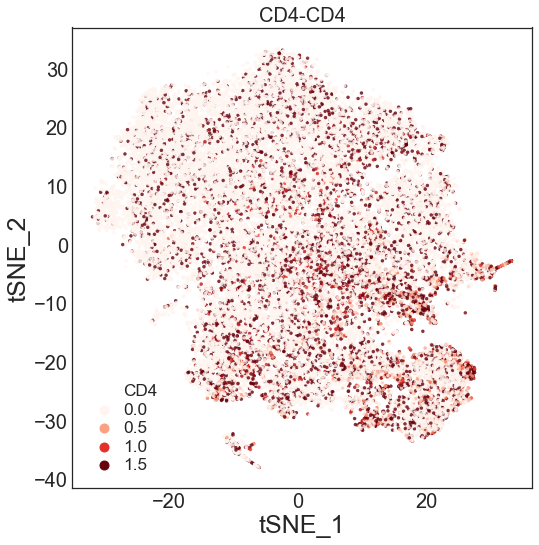

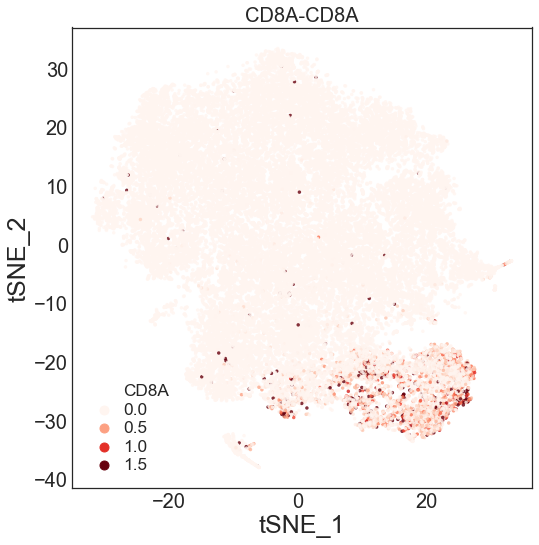

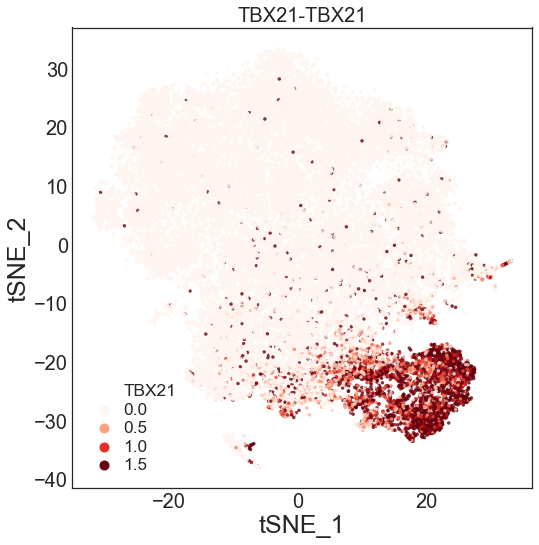

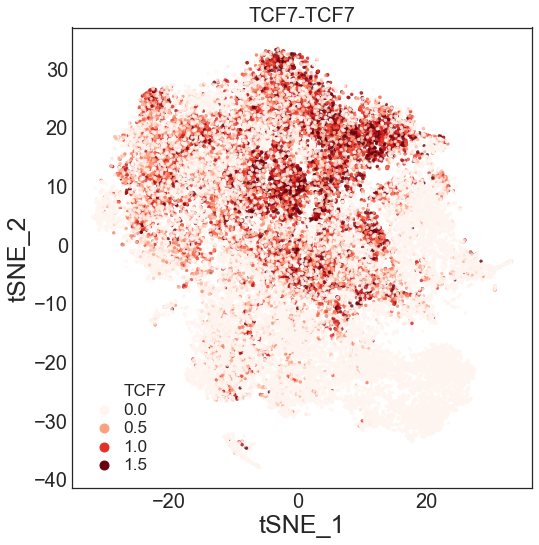

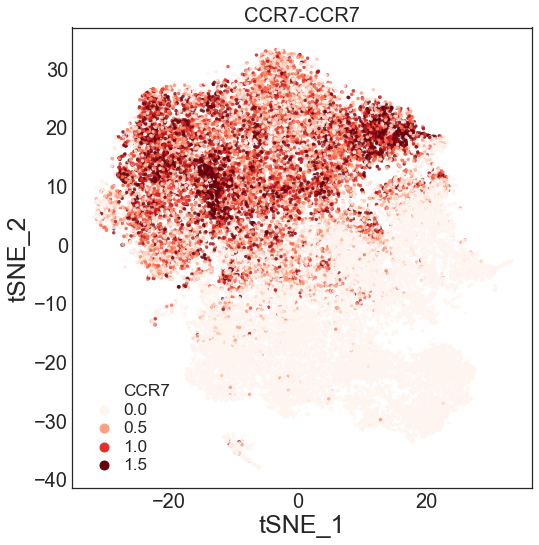

...

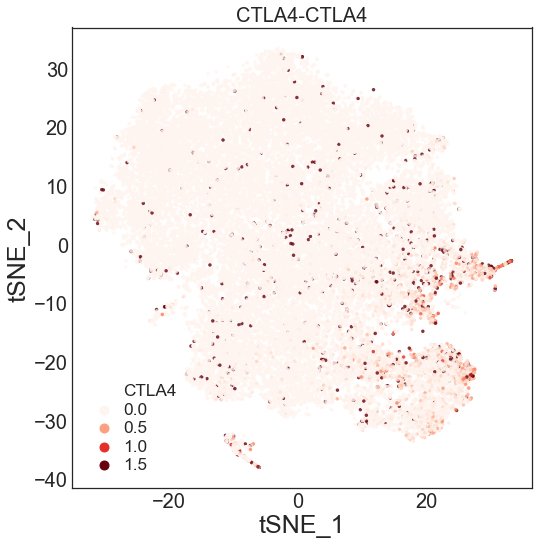

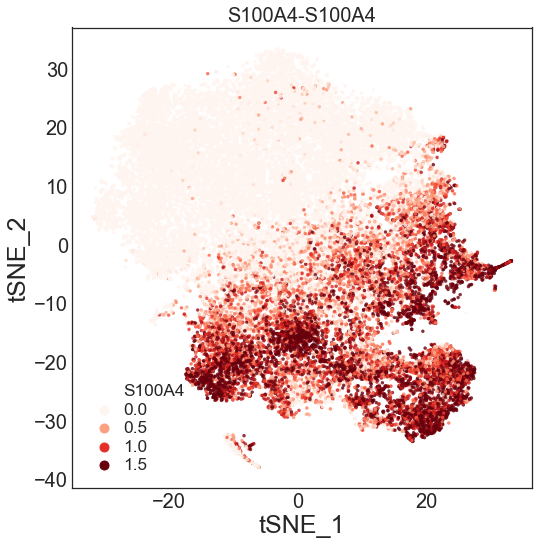

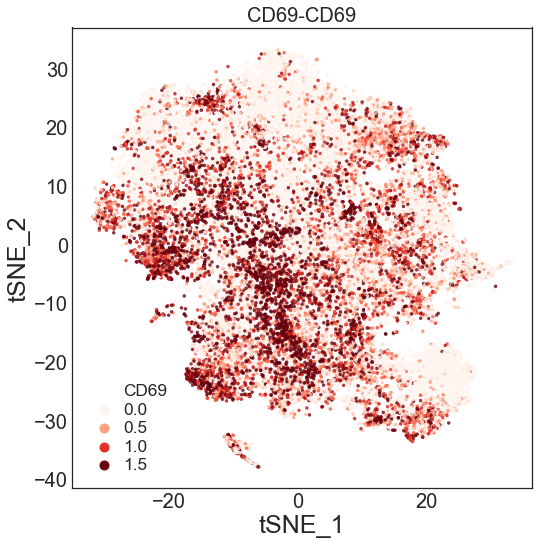

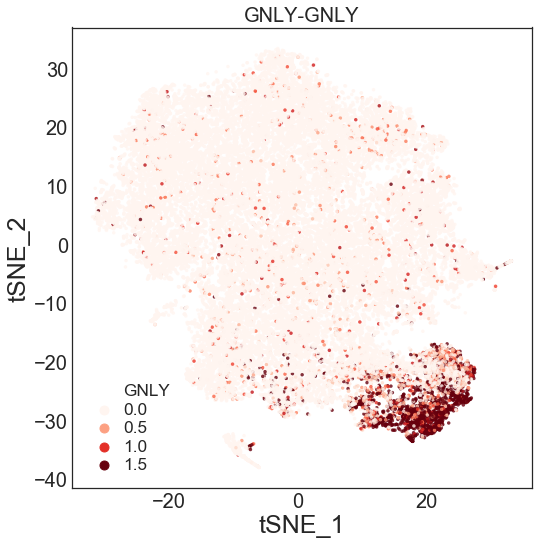

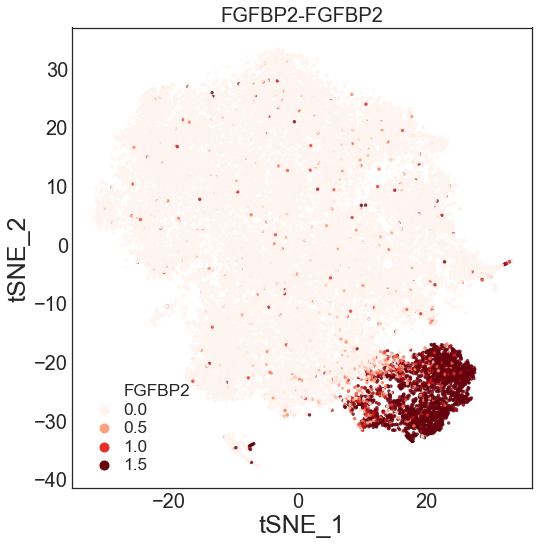

In [27]:
#Gene Expression Saver
subExpDFSaver=ReadTable(SAVER).loc[Genes].dropna(how='all')
OverlapCells=[i for i in list(subExpDFSaver) if i in MetaDF.index]
subExpDFSaver=subExpDFSaver[OverlapCells]
ZExpDFSaver=subExpDFSaver.apply(scipy.stats.mstats.zscore,axis=1)
subMetaDF=MetaDF.loc[OverlapCells]
for g in ['CD4','CD8A','TBX21','TCF7','CCR7','SELL','FOXP3','PDCD1','IL2RA','RORC','IFNG','GATA3','CXCR5','CCR6','CXCR3','TIGIT','CTLA4','S100A4','CD69','GNLY','FGFBP2']:
    subMetaDF[g]=ZExpDFSaver.loc[g]                      
    Scatter(ScatterDF=subMetaDF,X='tSNE_1',Y='tSNE_2',hue=g,outFilePrefix=os.path.join(Dir_Saver,'zscore'),hueColorDict='Reds',sub=g,legend=True,vmin=0,vmax=1.5)        
    

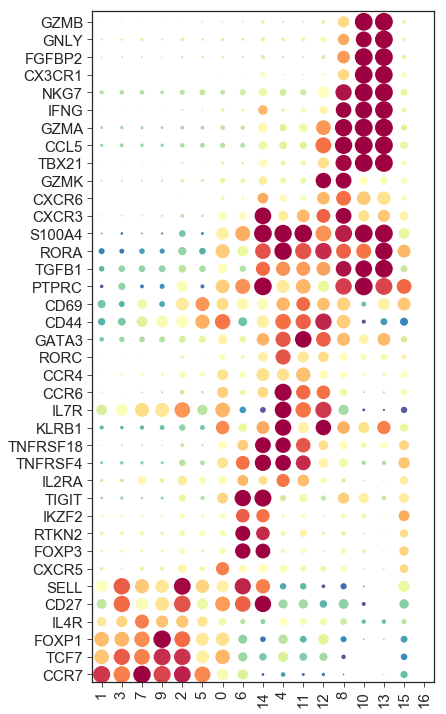

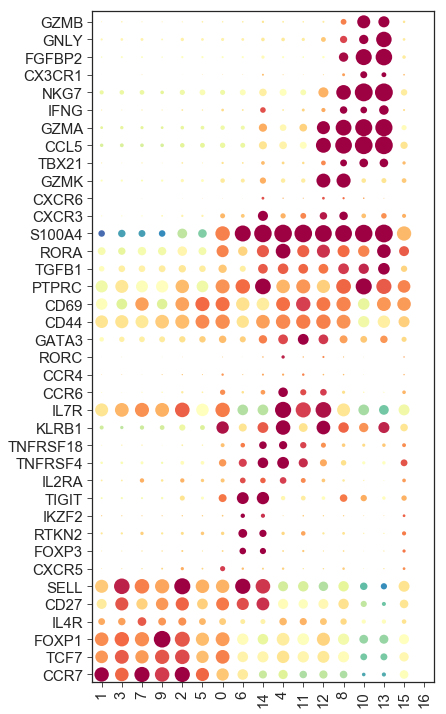

In [28]:
#CircularPlot 
def CircularPlot2(DF,SizeDF,FileLabel,Dir,vmin=0,vmax=2.5,cmap='Spectral_r'):
    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(0.7*len(list(DF)),0.35*len(DF)))
    ax=fig.add_axes([0.55,0.25,0.4,0.7])
    X=range(1,len(list(DF))+1)*len(DF)
    Y=sorted(range(1,len(DF)+1)*len(list(DF)))
    Color=[]
    Size=[]
    for i in DF.index:
        Color=Color+list(DF.loc[i])
        Size=Size+list(SizeDF.loc[i])
    Size=320*np.array(Size)
    ax.scatter(X,Y,c=Color,cmap=cmap,s=Size,edgecolors='none',linewidths=0,vmin=vmin,vmax=vmax)
    ax.set_xlim([0.5,len(list(DF))+0.5])
    ax.set_ylim([0.6,len(DF)+0.6])
    ax.set_xticks(range(1,len(list(DF))+1))
    ax.set_yticks(range(1,len(DF)+1))
    ax.set_xticklabels(list(DF),rotation='vertical')
    ax.set_yticklabels(list(DF.index))
    ax.tick_params(axis='y',length=5,labelsize=15,direction='out')
    ax.tick_params(axis='x',length=5,labelsize=15,direction='out')
    fig.savefig(os.path.join(Dir,FileLabel+'.ScatterPlot.pdf'))
    plt.show()

    
####################################################################################
SpList=['CCR7','TCF7','FOXP1','IL4R','CD27','SELL','CXCR5','FOXP3','RTKN2','IKZF2','TIGIT','IL2RA','TNFRSF4','TNFRSF18', 'KLRB1','IL7R','CCR6','CCR4','RORC','GATA3','CD44','CD69','PTPRC','TGFB1','RORA','S100A4','CXCR3','CXCR6','GZMK','TBX21','CCL5','GZMA','IFNG','NKG7','CX3CR1','FGFBP2','GNLY','GZMB']                                  
ClusterOrder=[1,3,7,9,2,5,0,6,14,4,11,12,8,10,13,15,16]
ColorDF=pd.DataFrame({},columns=ClusterOrder,index=SpList)
SizeDF=pd.DataFrame({},columns=ClusterOrder,index=SpList)
for i in ClusterOrder:
    subExp=ZExpDFSaver.T.loc[list(MetaDF[MetaDF['Cluster']==i].index)].dropna(how='all').T.loc[SpList]
    ColorDF[i]=subExp.apply(np.mean,axis=1)
    SizeDF[i]=((subExp>0).apply(sum,axis=1))/float(len(subExp.T))            
CircularPlot2(ColorDF,SizeDF,'zscore_Marker_Gene_CirclePlot',Dir_Saver,vmin=-1,vmax=1)


ColorDF=pd.DataFrame({},columns=ClusterOrder,index=SpList)
SizeDF=pd.DataFrame({},columns=ClusterOrder,index=SpList)
for i in ClusterOrder:
    subExp=ZExpDFSeurat.T.loc[list(MetaDF[MetaDF['Cluster']==i].index)].dropna(how='all').T.loc[SpList]
    ColorDF[i]=subExp.apply(np.mean,axis=1)
    SizeDF[i]=((subExp>0).apply(sum,axis=1))/float(len(subExp.T))            
CircularPlot2(ColorDF,SizeDF,'zscore_Marker_Gene_CirclePlot',Dir_Seurat,vmin=-1,vmax=0.5)



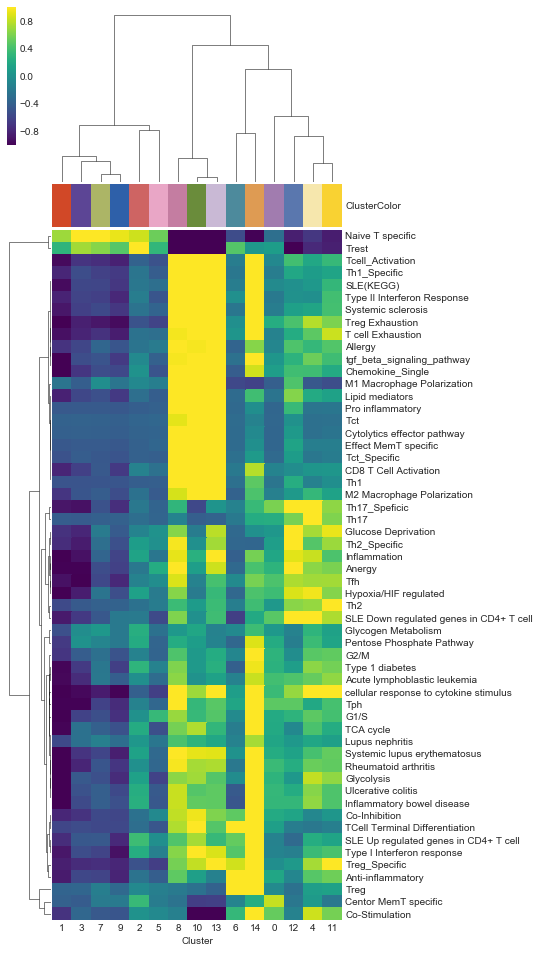

In [29]:
#Signature 
ClusterColorDF=pd.DataFrame({'ClusterColor':ClusterColorsDict.values()},index=ClusterColorsDict.keys())
def FeatureScore(ExpData,MetaDF,Dir,FeatureGeneDict=SignatureDict,group='Cluster',ColorDF=ClusterColorDF,Cmap='viridis',label='Cluster'):
    AllCells=list(set(list(ExpData)) & set(list(MetaDF.index)))
    ExpData=ExpData[AllCells]
    FeatureDF=pd.DataFrame({},index=AllCells)
    Features=list(FeatureGeneDict)
    for f in Features:
        Genes=FeatureGeneDict[f]
        FeatureDF[f]=list(ExpData.loc[Genes].dropna().apply(sum,axis=0))
    SaveTable(FeatureDF,os.path.join(Dir,'FeatureGene.Sum.txt'))
    ZFeatureDF=FeatureDF.apply(scipy.stats.zscore,axis=0)
    SaveTable(ZFeatureDF,os.path.join(Dir,'FeatureGene.Sum.Zscore.txt'))
    
    ZFeatureDF[group]=MetaDF.loc[AllCells][group]
    FeatureDF[group]=MetaDF.loc[AllCells][group]
    MFeatureDF=FeatureDF.groupby(group)[Features].apply(np.mean)
    MZFeatureDF=ZFeatureDF.groupby(group)[Features].apply(np.mean)
    
    fig=sns.clustermap(MZFeatureDF.T,figsize=(0.4*len(MZFeatureDF.T.columns),0.3*len(MZFeatureDF.T.index)),cmap=Cmap,row_cluster=True,col_cluster=True,method='average',metric='correlation',yticklabels=list(MZFeatureDF.T.index),xticklabels=list(MZFeatureDF.T),vmax=1,vmin=-1,col_colors=ColorDF)                                                            
    fig.savefig(os.path.join(Dir,label+'FeatureGene.Sum.Mean.Zscore.pdf'))
    plt.show()
    SaveTable(MZFeatureDF.T,os.path.join(Dir,'FeatureGene.Sum.Zscore.{}Mean.txt'.format(label)))
    return FeatureDF,ZFeatureDF,MZFeatureDF.T
 
def DoColormap(DF,label,Dir):
    fig=sns.clustermap(DF,figsize=(0.4*len(DF.columns),0.5*len(DF.index)),cmap='viridis',row_cluster=False,col_cluster=False,method='average',metric='correlation',yticklabels=list(DF.index),xticklabels=list(DF),vmax=1,vmin=-1,col_colors=ClusterColorDF)                                                            
    fig.savefig(os.path.join(Dir,label+'FeatureGene.Sum.Mean.Zscore.{}.pdf'.format(label)))
    plt.show()
    
    
FeatureDFSAVER,ZFeatureDFSAVER,ZFeatureDFSAVER_Mean=FeatureScore(subExpDFSaver,MetaDF[(MetaDF['Cluster']!=15) &(MetaDF['Cluster']!=16)],Dir_Saver,FeatureGeneDict=SignatureDict,group='Cluster',ColorDF=ClusterColorDF)                       
ClusterOrder=[1,3,7,9,2,5,0,6,14,4,11,12,8,10,13]


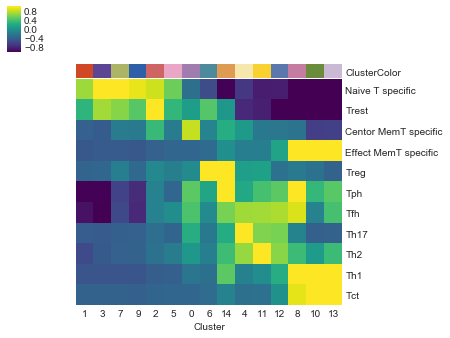

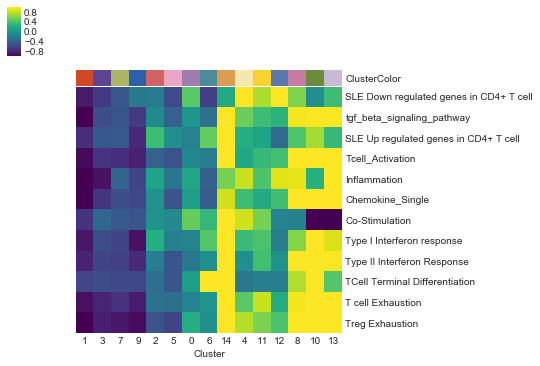

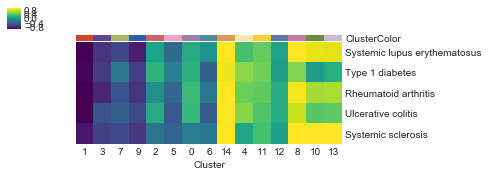

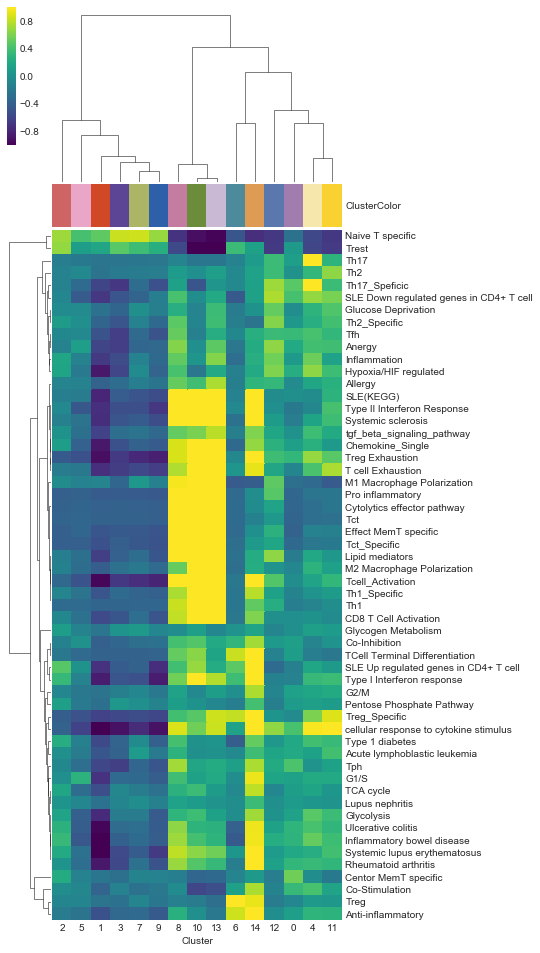

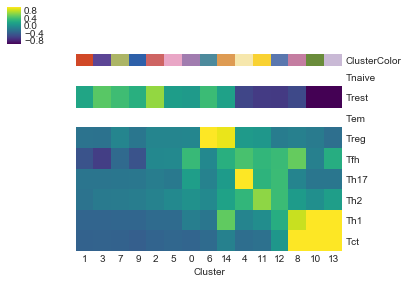

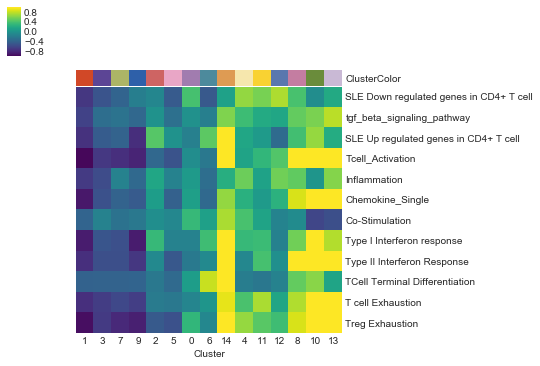

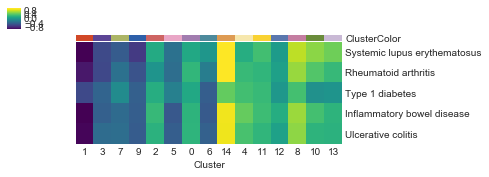

In [30]:
ZFeatureDFSAVER_Mean_celltype=ZFeatureDFSAVER_Mean[ClusterOrder].loc[['Naive T_Signature','Trest_Marker','Centor MemT_Specific','Effect MemT_Signature','Treg_Marker','Tph_Specific','Tfh_Marker','Th17_Marker','Th2_Marker','Th1_Marker','Tct_Marker']]                                
ZFeatureDFSAVER_Mean_function=ZFeatureDFSAVER_Mean[ClusterOrder].loc[['SLE Down regulated genes in CD4+ T cell','tgf_beta_signaling_pathway','SLE Up regulated genes in CD4+ T cell','Tcell_Activation','Inflammation','Chemokine_Single','Co-Stimulation','Type I Interferon response','Type II Interferon Response','TCell Terminal Differentiation','T cell Exhaustion','Treg Exhaustion']]                                
ZFeatureDFSAVER_Mean_Disease=ZFeatureDFSAVER_Mean[ClusterOrder].loc[['Systemic lupus erythematosus','Type 1 diabetes','Rheumatoid arthritis','Ulcerative colitis','Systemic sclerosis']] 
DoColormap(ZFeatureDFSAVER_Mean_celltype,'celltype',Dir_Saver)
DoColormap(ZFeatureDFSAVER_Mean_function,'function',Dir_Saver)
DoColormap(ZFeatureDFSAVER_Mean_Disease,'disease',Dir_Saver)
  
    
FeatureDFSeurat,ZFeatureDFSeurat,ZFeatureDFSeurat_Mean=FeatureScore(subExpDFSeurat,MetaDF[(MetaDF['Cluster']!=15) &(MetaDF['Cluster']!=16)],Dir_Saver,FeatureGeneDict=SignatureDict,group='Cluster',ColorDF=ClusterColorDF)                       
ClusterOrder=[1,3,7,9,2,5,0,6,14,4,11,12,8,10,13]

    

In [28]:
#Celltype 
CellTypeDict={'Treg':[6,14],'TEMRA':[10,13],'Th1':[8],'Th2':[11],'Th17':[4],'TN':[1,3,9,7,2,5],'TC':[0],'Low Genes':[15],'Undefined':[12]}
CelltypeColorsDict={'TN':'darkgreen','TC':'teal','Th1':'orangered','Undefined':'#F99F1B','Th17':'gold','Th2':'lightcoral','Treg':'saddlebrown','TEMRA':'firebrick','Low Genes':'lightgray'}                              
CelltypeClusterDict={0: 'TC',1: 'TN',2: 'TN',3: 'TN',4: 'Th17',5: 'TN',6: 'Treg',7: 'TN',8: 'Th1',9: 'TN',10: 'TEMRA',11: 'Th2',12: 'Undefined',13: 'TEMRA',14: 'Treg',15: 'Low Genes'}    #Low Genes: Undefined, Undefined: Tx               
MetaDF['Celltype']=[CelltypeClusterDict[i] for i in MetaDF['Cluster']]
MetaDF['Celltype_Color']=[CelltypeColorsDict[i] for i in MetaDF['Celltype']]
SaveTable(MetaDF,MetaData[:-4]+'.Detailed.txt' )



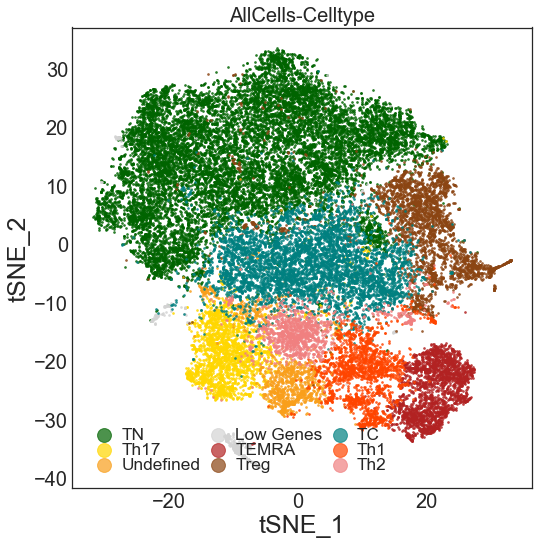

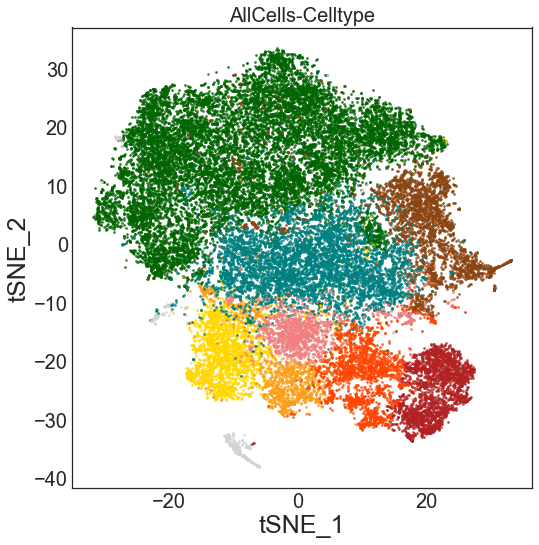

In [33]:
Scatter(ScatterDF=MetaDF,hue='Celltype',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict=CelltypeColorsDict,sub='AllCells')            
Scatter(ScatterDF=MetaDF,hue='Celltype',outFilePrefix=os.path.join(Dir,'AllCellScatter'),hueColorDict=CelltypeColorsDict,sub='AllCells',legend=False)                          


# Celltype Ratio

In [34]:
Dir=os.path.join(outDir,'Celltype_Ratio')
if not os.path.exists(Dir):
    os.mkdir(Dir)


In [35]:
def PieChart(DataDF,label,Dir, hue=None, hueOrder=None, colorSets=None, Num=True):
    print 'Get:PieChart'
    DataDF['N']=[1]*len(DataDF)
    
    Data=pd.DataFrame(DataDF.groupby(hue)['N'].apply(sum,axis=0))
    Data=Data.loc[hueOrder]
    Data['x']=[i/float(sum(Data['N'])) for i in Data['N']]
    
    print Data
    
   
    BarPdf=os.path.join(Dir, label+'_'+hue+'.BarPlot.pdf')
    PiePdf=os.path.join(Dir, label+'_'+hue+'.PiePlot.pdf')
    plt.style.use('seaborn-white')
    fig4=plt.figure(figsize=(1.5,5.0))
    ax4=fig4.add_axes([0.15,0.15,0.8,0.8])
    Fig=[]
    
    for i in range(len(Data.index)):
        bottom=[sum(Data['x'][:i])]
        F=plt.bar([1],Data.loc[Data.index[i]]['x'],width=0.6,bottom=bottom,color=colorSets[Data.index[i]])
        Fig.append(F)
    ax4.set_ylabel('Proportion of peaks',fontsize=25)
    ax4.set_xlabel('Chromatin-state',fontsize=25)
#    plt.legend([i[0] for i in Fig],DF.index)
    fig4.savefig(BarPdf)
    
    fig5=plt.figure(figsize=(5.0,5.0))
    ax5=fig5.add_axes([0.15,0.15,0.8,0.8])
    patches1,texts1=ax5.pie(Data['x'],colors=[colorSets[i] for i in Data.index],labels=[str(i)[:5] for i in Data['x']])                  
    #ax5.legend(patches1,Data.index, loc='best',fancybox=False,edgecolor='none',fontsize='x-large')
    fig5.savefig(PiePdf)
    plt.show()
    
    

Get:PieChart
               N         x
Celltype                  
TN         15187  0.446926
TC          5671  0.166887
Treg        3239  0.095318
Th17        2444  0.071923
Th2         1290  0.037962
Th1         1997  0.058768
TEMRA       2402  0.070687
Undefined   1287  0.037874
Low Genes    464  0.013655


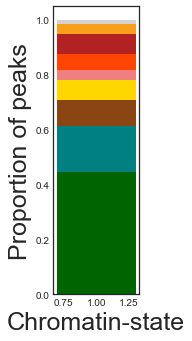

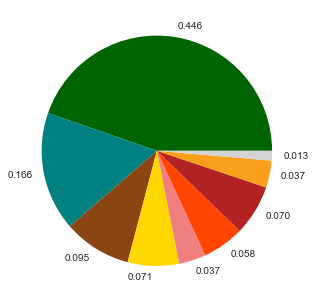

Get:PieChart
              N         x
Celltype                 
TN         5403  0.505284
TC         2476  0.231553
Treg        323  0.030207
Th17        803  0.075096
Th2         435  0.040681
Th1         392  0.036659
TEMRA       316  0.029552
Undefined   505  0.047227
Low Genes    40  0.003741


/Users/liuqian/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


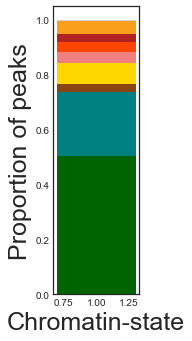

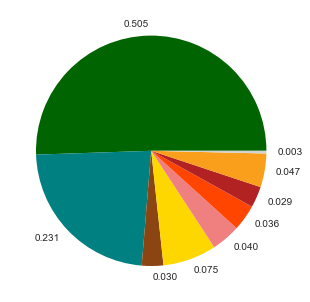

Get:PieChart
              N         x
Celltype                 
TN         9784  0.420131
TC         3195  0.137195
Treg       2916  0.125215
Th17       1641  0.070465
Th2         855  0.036714
Th1        1605  0.068920
TEMRA      2086  0.089574
Undefined   782  0.033580
Low Genes   424  0.018207


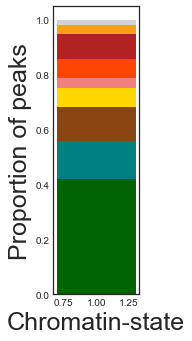

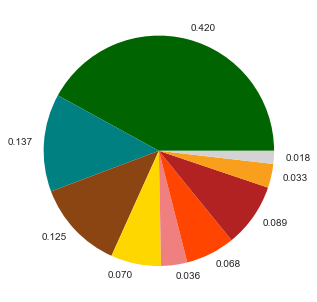

In [36]:
PieChart(MetaDF,'AllCells',Dir, hue='Celltype',hueOrder=['TN','TC','Treg','Th17','Th2','Th1','TEMRA','Undefined','Low Genes'], colorSets=CelltypeColorsDict, Num=True)
PieChart(MetaDF[MetaDF['State2']=='N'],'NormCells',Dir, hue='Celltype',hueOrder=['TN','TC','Treg','Th17','Th2','Th1','TEMRA','Undefined','Low Genes'], colorSets=CelltypeColorsDict, Num=True)
PieChart(MetaDF[MetaDF['State2']!='N'],'SLECells',Dir, hue='Celltype',hueOrder=['TN','TC','Treg','Th17','Th2','Th1','TEMRA','Undefined','Low Genes'], colorSets=CelltypeColorsDict, Num=True)



In [37]:
#Fisher test

5290 5403 13504 9784 33981 15187
8217 2476 20093 3195 33981 5671
10370 323 20372 2916 33981 3239
10258 435 22433 855 33981 1290
9890 803 21647 1641 33981 2444
10301 392 21683 1605 33981 1997
10377 316 21202 2086 33981 2402
10188 505 22506 782 33981 1287


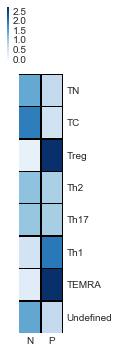

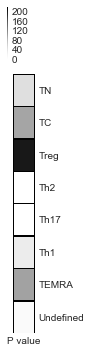

In [38]:
#Cell type
CelltypeOrder=['TN','TC','Treg','Th2','Th17','Th1','TEMRA','Undefined']
P=[]
R=[]
All_Number=len(MetaDF)

for i in CelltypeOrder:
        Cluster_Number=len(MetaDF[(MetaDF['Celltype']==i)])
        Cluster_N=len(MetaDF[(MetaDF['Celltype']==i)&(MetaDF['State2']=='N')])
        Cluster_P=len(MetaDF[(MetaDF['Celltype']==i)&(MetaDF['State2']=='S')])
        All_N=len(MetaDF[(MetaDF['Celltype']!=i)&(MetaDF['State2']=='N')])
        All_P=len(MetaDF[(MetaDF['Celltype']!=i)&(MetaDF['State2']=='S')])
        print All_N,Cluster_N,All_P,Cluster_P,All_Number,Cluster_Number
        r,p=scipy.stats.fisher_exact([[Cluster_P,All_P], [Cluster_N,All_N]])
        P.append(-math.log10(p))
        R.append(r)

PvalDF=pd.DataFrame({'P value':P},index=CelltypeOrder)
ODDF=pd.DataFrame({'N':[1/float(i) for i in R],'P':R},index=CelltypeOrder)

fig1=sns.clustermap(ODDF,figsize=[1,6],cmap='Blues',col_cluster=False,row_cluster=False,vmax=2.7,vmin=0,linewidths=0.5, linecolor='k')             
fig2=sns.clustermap(PvalDF,figsize=[0.5,6],cmap='Greys',col_cluster=False,row_cluster=False,vmax=220,vmin=0,linewidths=0.5, linecolor='k')             
fig1.savefig(os.path.join(Dir,'CelltypeOrderEnrich.OddsRatio.pdf'))
fig2.savefig(os.path.join(Dir,'CelltypeOrderEnrich.Pvalue.Fisher.pdf'))
plt.show()



9214 1479 21472 1816 33981 3295
9866 827 21525 1763 33981 2590
9837 856 21929 1359 33981 2215
9631 1062 22778 510 33981 1572
9781 912 21024 2264 33981 3176
10426 267 21216 2072 33981 2339
8217 2476 20093 3195 33981 5671
10499 194 21216 2072 33981 2266
10564 129 22444 844 33981 973
9890 803 21647 1641 33981 2444
10258 435 22433 855 33981 1290
10188 505 22506 782 33981 1287
10301 392 21683 1605 33981 1997
10561 132 21995 1293 33981 1425
10509 184 22495 793 33981 977
10653 40 22864 424 33981 464


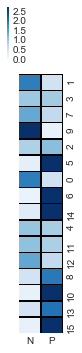

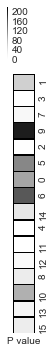

In [39]:
#Cluster
ClusterOrder=[1,3,7,9,2,5,0,6,14,4,11,12,8,10,13,15]
P=[]
R=[]
All_Number=len(MetaDF)

for i in ClusterOrder:
        Cluster_Number=len(MetaDF[(MetaDF['Cluster']==i)])
        Cluster_N=len(MetaDF[(MetaDF['Cluster']==i)&(MetaDF['State2']=='N')])
        Cluster_P=len(MetaDF[(MetaDF['Cluster']==i)&(MetaDF['State2']=='S')])
        All_N=len(MetaDF[(MetaDF['Cluster']!=i)&(MetaDF['State2']=='N')])
        All_P=len(MetaDF[(MetaDF['Cluster']!=i)&(MetaDF['State2']=='S')])
        print All_N,Cluster_N,All_P,Cluster_P,All_Number,Cluster_Number
        r,p=scipy.stats.fisher_exact([[Cluster_P,All_P], [Cluster_N,All_N]])
        P.append(-math.log10(p))
        R.append(r)

PvalDF=pd.DataFrame({'P value':P},index=ClusterOrder)
ODDF=pd.DataFrame({'N':[1/float(i) for i in R],'P':R},index=ClusterOrder)

fig1=sns.clustermap(ODDF,figsize=[1,6],cmap='Blues',col_cluster=False,row_cluster=False,vmax=2.7,vmin=0,linewidths=0.5, linecolor='k')             
fig2=sns.clustermap(PvalDF,figsize=[0.5,6],cmap='Greys',col_cluster=False,row_cluster=False,vmax=220,vmin=0,linewidths=0.5, linecolor='k')             
fig1.savefig(os.path.join(Dir,'ClusterOrderEnrich.OddsRatio.pdf'))
fig2.savefig(os.path.join(Dir,'ClusterOrderEnrich.Pvalue.Fisher.pdf'))
plt.show()


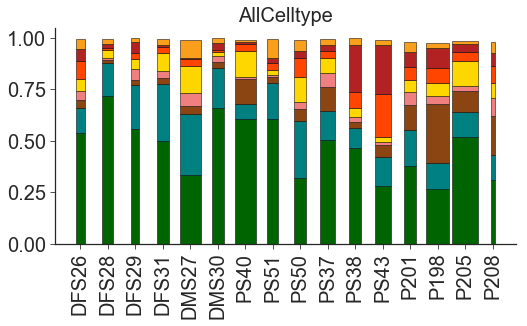

In [40]:
CelltypeOrder=['TN','TC','Treg','Th2','Th17','Th1','TEMRA','Undefined']
SampleMetaDF=MetaDF[(MetaDF['SampleName']!='Unknown')]
SampleCelltypeRatio=BarPlot(SampleMetaDF.dropna(axis=1,how='all'),'AllCelltype',Dir,Y='Celltype',X='SampleName',ColorsDict=CelltypeColorsDict,Xcount=True,xsorthue=None,Xorder=SampleOrder,ysorthue=None,Yorder=CelltypeOrder)               
SaveTable(SampleCelltypeRatio, os.path.join(Dir,'Sample_Celltype.txt'))


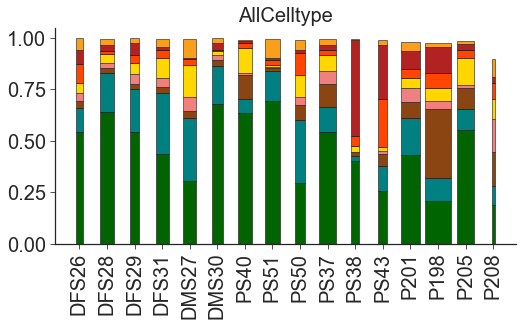

In [41]:
SampleMetaDF_SoupCell=MetaDF[(MetaDF['SoupCell_SampleName']!='Unknown')]
SampleCelltypeRatio_SoupCell=BarPlot(SampleMetaDF_SoupCell.dropna(axis=1,how='all'),'AllCelltype',Dir,Y='Celltype',X='SoupCell_SampleName',ColorsDict=CelltypeColorsDict,Xcount=True,xsorthue=None,Xorder=SampleOrder,ysorthue=None,Yorder=CelltypeOrder)               
SaveTable(SampleCelltypeRatio_SoupCell, os.path.join(Dir,'SoupCell_Sample_Celltype.txt'))



In [ ]:
#Celltype proportation for each individuals

In [47]:
def log10(L):return -math.log(L,10)

def Sigfinicance(L1,L2):
    return round(log10(scipy.stats.ttest_ind([i for i in L1 if abs(i)>-1],[i for i in L2 if abs(i)>-1])[1]),3)

def SampleRatioPlot(RatioDF,InfoDF,label,Dir,hue=None,hueOrder=None,XOrder=None,hueColorDict=None,boxhueColorDict=None,vmax=0.5,vmin=0):
    X=[]
    Y=[]
    Hue=[]
    Title=''
    for m in range(len(hueOrder)):
        for n in range(m+1,len(hueOrder)):
            hue1=hueOrder[m]
            hue2=hueOrder[n]
            Hue1=list(InfoDF[InfoDF[hue]==hue1].index)
            Hue2=list(InfoDF[InfoDF[hue]==hue2].index)
            Title=Title+hue1+'.'+hue2+'_'
            for i in list(RatioDF.index):
                A=list(RatioDF[Hue1].loc[i])
                B=list(RatioDF[Hue2].loc[i])
                Title=Title+str(i)+'['+str(Sigfinicance(A,B))+']'+'_'
                X=X+[i]*len(A+B)
                Y=Y+A+B
                Hue=Hue+[hue1]*len(Hue1)+[hue2]*len(Hue2)
            Title=Title+'\n'
    
    FinalRatioDF=pd.DataFrame({'x':X,'y':Y,'hue':Hue}).drop_duplicates()
    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(len(set(FinalRatioDF['x'])),4))
    ax=fig.add_axes([0.05,0.05,0.8,0.8])

    ax.set_title(Title,fontsize=12)                    
    ax.tick_params(axis='x',length=7,labelsize=15,direction='in')
    ax.tick_params(axis='y',length=7,labelsize=15,direction='in')
    ax.set_ylim([vmin,vmax])  
    
    print FinalRatioDF
    sns.boxplot(x='x', y='y', hue='hue',data=FinalRatioDF,order=XOrder,hue_order=hueOrder,palette=boxhueColorDict,linewidth=1,ax=ax,saturation=1,fliersize=1)                   
    sns.swarmplot(x='x',y='y',hue='hue',data=FinalRatioDF,order=XOrder,hue_order=hueOrder,palette=hueColorDict,size=4,linewidth=0,ax=ax,dodge=True)
    
    fig.savefig(os.path.join(Dir,label+'.Ratioplot.pdf'))
    plt.show()
    
    SaveTable(FinalRatioDF,os.path.join(Dir,label+'.Ratioplot.txt'))
    
    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(len(set(FinalRatioDF['x']))*0.8,3))
    ax=fig.add_axes([0.05,0.05,0.8,0.8])
    ax.set_title(Title,fontsize=12)                    
    ax.tick_params(axis='x',length=7,labelsize=15,direction='in')
    ax.tick_params(axis='y',length=7,labelsize=15,direction='in')
    ax.set_ylim([vmin,vmax])  
    sns.barplot(x="x", y="y",hue='hue',data=FinalRatioDF,order=XOrder,hue_order=hueOrder,palette=boxhueColorDict,errwidth=1,capsize=0.1,ax=ax,edgecolor='k',linewidth=0.5)
    fig.savefig(os.path.join(Dir,label+'.Barplot.pdf'))
    plt.show()

    

    hue          x         y
0     N         TN  0.500000
1     N         TN  0.556684
2     N         TN  0.539837
3     N         TN  0.657485
4     N         TN  0.334031
5     N         TN  0.715481
6     S         TN  0.466749
7     S         TN  0.319753
8     S         TN  0.503435
9     S         TN  0.279599
10    S         TN  0.606615
11    S         TN  0.604497
12    S         TN  0.264420
13    S         TN  0.375328
14    S         TN  0.517978
15    S         TN  0.311111
16    N         TC  0.278465
17    N         TC  0.213198
18    N         TC  0.121951
19    N         TC  0.197605
20    N         TC  0.297768
21    N         TC  0.163180
22    S         TC  0.097291
23    S         TC  0.279012
24    S         TC  0.143278
25    S         TC  0.142077
26    S         TC  0.074595
27    S         TC  0.175926
28    S         TC  0.126377
29    S         TC  0.177165
..   ..        ...       ...
98    N      TEMRA  0.060163
99    N      TEMRA  0.033533
100   N      T

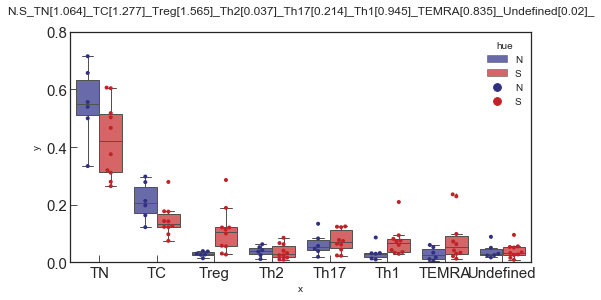

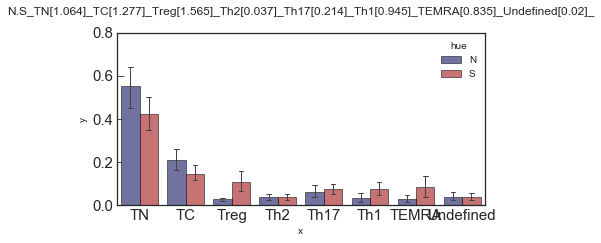

    hue          x         y
0     N         TN  0.433610
1     N         TN  0.540971
2     N         TN  0.542064
3     N         TN  0.677223
4     N         TN  0.306037
5     N         TN  0.637452
6     S         TN  0.400000
7     S         TN  0.292949
8     S         TN  0.541852
9     S         TN  0.256318
10    S         TN  0.634995
11    S         TN  0.694305
12    S         TN  0.208899
13    S         TN  0.430108
14    S         TN  0.554152
15    S         TN  0.188341
16    N         TC  0.296680
17    N         TC  0.207891
18    N         TC  0.114484
19    N         TC  0.183313
20    N         TC  0.304462
21    N         TC  0.192050
22    S         TC  0.024314
23    S         TC  0.308333
24    S         TC  0.120097
25    S         TC  0.121300
26    S         TC  0.067262
27    S         TC  0.143964
28    S         TC  0.110357
29    S         TC  0.181452
..   ..        ...       ...
98    N      TEMRA  0.067650
99    N      TEMRA  0.031060
100   N      T

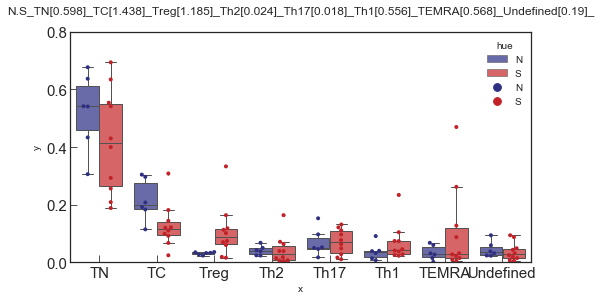

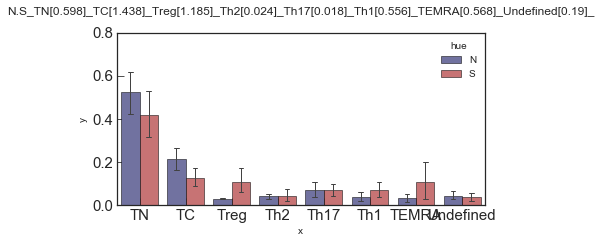

In [48]:
SampleInfoDF=SampleMetaDF[['SampleName','State2']].drop_duplicates().dropna()
SampleInfoDF.index=SampleInfoDF['SampleName']
SampleRatioPlot(SampleCelltypeRatio,SampleInfoDF,'ClinicalState_CelltypeRatio',Dir,hue='State2',hueOrder=['N','S'],XOrder=CelltypeOrder,hueColorDict={'N':'#303082','S':'#C22227'},boxhueColorDict={'N':'#696BA8','S':'#D56566'},vmax=0.8,vmin=0)          
SampleRatioPlot(SampleCelltypeRatio_SoupCell,SampleInfoDF,'ClinicalState_CelltypeRatio_SoupCell',Dir,hue='State2',hueOrder=['N','S'],XOrder=CelltypeOrder,hueColorDict={'N':'#303082','S':'#C22227'},boxhueColorDict={'N':'#696BA8','S':'#D56566'},vmax=0.8,vmin=0)          


    hue   x         y
0     N   1  0.152228
1     N   1  0.206430
2     N   1  0.136585
3     N   1  0.101796
4     N   1  0.104603
5     N   1  0.244073
6     S   1  0.057882
7     S   1  0.041975
8     S   1  0.030422
9     S   1  0.022769
10    S   1  0.002111
11    S   1  0.261905
12    S   1  0.038885
13    S   1  0.133858
14    S   1  0.060112
15    S   1  0.081481
16    N   3  0.102723
17    N   3  0.096447
18    N   3  0.107317
19    N   3  0.114970
20    N   3  0.039052
21    N   3  0.075314
22    S   3  0.059113
23    S   3  0.013580
24    S   3  0.363101
25    S   3  0.015483
26    S   3  0.007741
27    S   3  0.026455
28    S   3  0.093325
29    S   3  0.027559
..   ..  ..       ...
226   N  12  0.050407
227   N  12  0.023952
228   N  12  0.088563
229   N  12  0.025105
230   S  12  0.034483
231   S  12  0.053086
232   S  12  0.032385
233   S  12  0.027322
234   S  12  0.008445
235   S  12  0.095238
236   S  12  0.025275
237   S  12  0.051181
238   S  12  0.015730
239   S  1

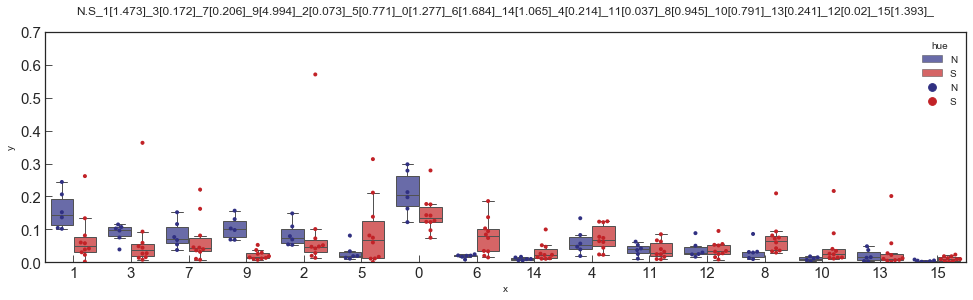

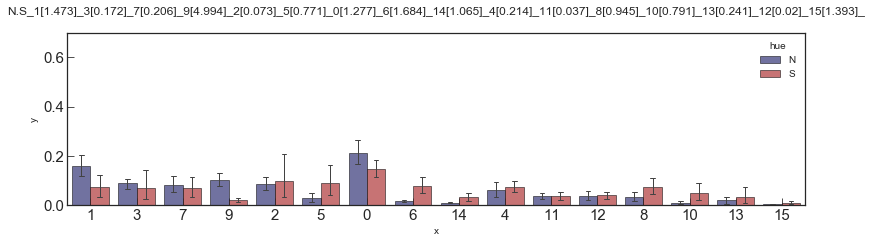

    hue   x         y
0     N   1  0.142635
1     N   1  0.204097
2     N   1  0.124024
3     N   1  0.116931
4     N   1  0.091864
5     N   1  0.202107
6     S   1  0.002353
7     S   1  0.035256
8     S   1  0.013344
9     S   1  0.015162
10    S   1  0.000941
11    S   1  0.364465
12    S   1  0.022122
13    S   1  0.176411
14    S   1  0.063529
15    S   1  0.094170
16    N   3  0.082988
17    N   3  0.102428
18    N   3  0.113617
19    N   3  0.121194
20    N   3  0.029921
21    N   3  0.064655
22    S   3  0.010196
23    S   3  0.003205
24    S   3  0.443591
25    S   3  0.004332
26    S   3  0.007996
27    S   3  0.003645
28    S   3  0.093263
29    S   3  0.022849
..   ..  ..       ...
226   N  12  0.058977
227   N  12  0.023752
228   N  12  0.093963
229   N  12  0.031609
230   S  12  0.005490
231   S  12  0.048718
232   S  12  0.031136
233   S  12  0.024549
234   S  12  0.007526
235   S  12  0.093850
236   S  12  0.018854
237   S  12  0.043347
238   S  12  0.014543
239   S  1

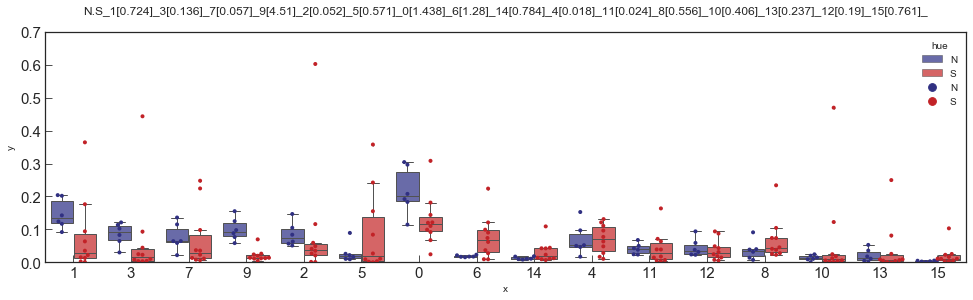

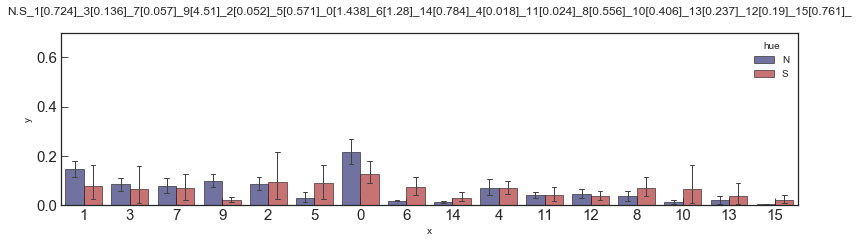

In [49]:
SampleRatioPlot(SampleClusterRatio,SampleInfoDF,'ClinicalState_ClusterRatio',Dir,hue='State2',hueOrder=['N','S'],XOrder=ClusterOrder,hueColorDict={'N':'#303082','S':'#C22227'},boxhueColorDict={'N':'#696BA8','S':'#D56566'},vmax=0.7,vmin=0)          

SampleRatioPlot(SampleClusterRatio_SoupCell,SampleInfoDF,'ClinicalState_ClusterRatio_SoupCell',Dir,hue='State2',hueOrder=['N','S'],XOrder=ClusterOrder,hueColorDict={'N':'#303082','S':'#C22227'},boxhueColorDict={'N':'#696BA8','S':'#D56566'},vmax=0.7,vmin=0)          


In [ ]:
#FACS 

      hue      x         y
0    Norm     TN  0.245210
1    Norm     TN  0.363014
2    Norm     TN  0.370766
3    Norm     TN  0.481586
4    Norm     TN  0.289931
5    Norm     TN  0.499330
6    Norm     TN  0.510292
7    Norm     TN  0.205212
8    Norm     TN  0.258129
9    Norm     TN  0.316806
10   Norm     TN  0.315185
11   Norm     TN       NaN
24    SLE     TN  0.060466
25    SLE     TN  0.237615
26    SLE     TN  0.059942
27    SLE     TN  0.023011
28    SLE     TN  0.014259
29    SLE     TN  0.211149
30    SLE     TN  0.220632
31    SLE     TN  0.338108
32    SLE     TN  0.061382
33    SLE     TN  0.053088
34    SLE     TN  0.041265
35    SLE     TN  0.266737
36    SLE     TN  0.323950
37    SLE     TN  0.101926
38    SLE     TN       NaN
48   Norm  CXCR5  0.116767
49   Norm  CXCR5  0.081063
50   Norm  CXCR5  0.072082
..    ...    ...       ...
269   SLE    Th1  0.070264
270   SLE    Th1  0.123971
271   SLE    Th1  0.064461
272   SLE    Th1  0.075173
273   SLE    Th1  0.086575
2

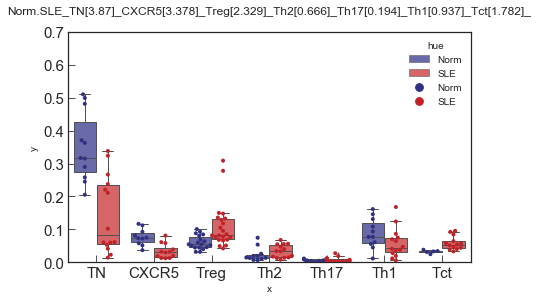

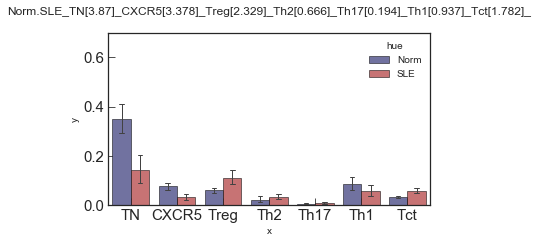

In [51]:
PropDF=ReadTable(PropFile)
SampleDF=pd.DataFrame({},index=list(PropDF))
SampleDF['ClinicalState']=[i.split('.')[0] for i in list(SampleDF.index)]
SampleRatioPlot(PropDF/100,SampleDF,'ClinicalState_FACS_Proportion',Dir,hue='ClinicalState',hueOrder=['Norm','SLE'],XOrder=['TN','CXCR5','Treg','Th2','Th17','Th1','Tct'],hueColorDict={'Norm':'#303082','SLE':'#C22227'},boxhueColorDict={'Norm':'#696BA8','SLE':'#D56566'},vmax=0.7,vmin=0)                           



# Distance between normal and healthy controls

In [52]:
Dir=os.path.join(outDir,'Celltype_NormSLEDistance')
Mkdir(Dir)


In [53]:
AllCells=list(MetaDF.index)
Seurat_DF=ReadTable(DATA).T.loc[AllCells]
ZSeurat_DF=Seurat_DF.apply(scipy.stats.zscore,axis=0)

Seurat_DF['Celltype']=MetaDF.loc[AllCells]['Celltype']
NormExpMean=Seurat_DF.loc[MetaDF[MetaDF['State']=='Norm'].index].groupby('Celltype')[list(Seurat_DF)[:-1]].apply(np.mean)                                              
SLEExpMean=Seurat_DF.loc[MetaDF[MetaDF['State']!='Norm'].index].groupby('Celltype')[list(Seurat_DF)[:-1]].apply(np.mean)



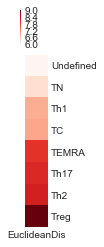

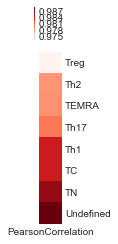

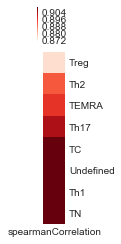

In [57]:
CelltypeOrder=['TN','TC','Treg','Th2','Th17','Th1','TEMRA','Undefined']

Dis=pd.DataFrame({}, index=CelltypeOrder)
dis=[]
for ct in CelltypeOrder:
    A=NormExpMean.T[(NormExpMean.loc[ct]>0.2)|(SLEExpMean.loc[ct]>0.2)][ct]
    B=SLEExpMean.T[(NormExpMean.loc[ct]>0.2)|(SLEExpMean.loc[ct]>0.2)][ct]
    dis.append(scipy.spatial.distance.euclidean(A,B))
Dis['EuclideanDis']=dis

fig=sns.clustermap(Dis.sort_values('EuclideanDis'),figsize=(0.5,4),col_cluster=False, row_cluster=False, cmap='Reds')                                              
fig.savefig(os.path.join(Dir,'NormSLE_EuclideanDis.Celltypes.pdf'))
plt.show()
SaveTable(Dis.sort_values('EuclideanDis'),os.path.join(Dir,'NormSLE_EuclideanDis.Celltypes.txt'))


Dis=pd.DataFrame({}, index=CelltypeOrder)
dis=[]
for ct in CelltypeOrder:
    A=NormExpMean.T[(NormExpMean.loc[ct]>0.2)|(SLEExpMean.loc[ct]>0.2)][ct]
    B=SLEExpMean.T[(NormExpMean.loc[ct]>0.2)|(SLEExpMean.loc[ct]>0.2)][ct]
    dis.append(scipy.stats.pearsonr(A,B)[0])
Dis['PearsonCorrelation']=dis

fig=sns.clustermap(Dis.sort_values('PearsonCorrelation'),figsize=(0.5,4),col_cluster=False, row_cluster=False, cmap='Reds')                                              
fig.savefig(os.path.join(Dir,'NormSLE_PearsonCorrelation.Celltypes.pdf'))
plt.show()
SaveTable(Dis.sort_values('PearsonCorrelation'),os.path.join(Dir,'NormSLE_PearsonCorrelation.Celltypes.txt'))


Dis=pd.DataFrame({}, index=CelltypeOrder)
dis=[]
for ct in CelltypeOrder:
    A=NormExpMean.T[(NormExpMean.loc[ct]>0.2)|(SLEExpMean.loc[ct]>0.2)][ct]
    B=SLEExpMean.T[(NormExpMean.loc[ct]>0.2)|(SLEExpMean.loc[ct]>0.2)][ct]
    dis.append(scipy.stats.spearmanr(A,B)[0])
Dis['spearmanCorrelation']=dis

fig=sns.clustermap(Dis.sort_values('spearmanCorrelation'),figsize=(0.5,4),col_cluster=False, row_cluster=False,vmin=0.87,vmax=0.91, cmap='Reds')                                              
fig.savefig(os.path.join(Dir,'NormSLE_spearmanCorrelation.Celltypes.pdf'))
plt.show()
SaveTable(Dis.sort_values('spearmanCorrelation'),os.path.join(Dir,'NormSLE_spearmanCorrelation.Celltypes.txt'))



# Differentially Expressed Genes SAVER

In [19]:
Dir=os.path.join(outDir,'Celltype_DiffGenes')
Mkdir(Dir)



In [20]:
AllCells=list(MetaDF.index)
SAVER_DF=ReadTable(SAVER).T.loc[AllCells]
ZSAVER_DF=SAVER_DF.apply(scipy.stats.zscore,axis=0)


In [21]:
def ViolinPlot(DF,label, x,y,hue='State',hueDict={'N':'darkblue','S':'firebrick'}):
    Title=''
    for i in list(set(DF[x])):
        df=DF[DF[x]==i]
        A=df[df[hue]=='N'][y]
        B=df[df[hue]=='S'][y]
        Title=Title+i+':'+str(scipy.stats.mannwhitneyu(A.values,B.values)[1])+'_'
    
    fig=plt.figure(figsize=(3.3*len(set(DF[x])),3))
    #ax=fig.add_axes([10.0/(10+0.45*len(list(DF))),0.2,0.95-10.0/(10+0.45*len(list(DF))),0.7])
    ax=fig.add_axes([0.2,0.2,0.8,0.7])
    sns.violinplot(x=x, y=y, hue="State",data=DF, palette=hueDict,split=False,  inner=None,ax=ax) 
    ax.set_title(Title)
#    ax.set_ylim(-1,5)
    plt.savefig(os.path.join(Dir, label+'.pdf'))
    plt.show()
    SaveTable(DF,os.path.join(Dir, label+'.txt'))
    

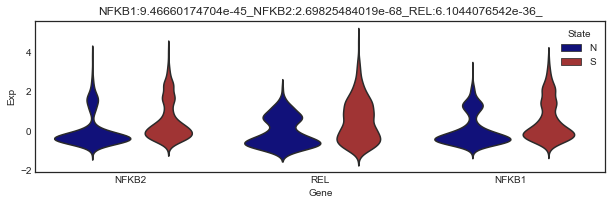

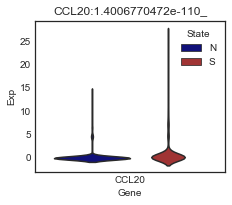

In [75]:
Cells=list(set(MetaDF[MetaDF['Celltype']=='Th17'].index).intersection(set(ZSAVER_DF.index)))
AllCells=Cells+Cells+Cells
DF=pd.DataFrame({'Gene':['NFKB1']*len(Cells)+['NFKB2']*len(Cells)+['REL']*len(Cells),'Exp':list(ZSAVER_DF.loc[Cells]['NFKB1'])+list(ZSAVER_DF.loc[Cells]['NFKB2'])+list(ZSAVER_DF.loc[Cells]['REL']),'State':list(MetaDF.loc[Cells]['State2'])*3},index=AllCells)                                       
ViolinPlot(DF.sort_values('State'),'Th17_NFKB_SAVER', 'Gene','Exp',hue='State',hueDict={'N':'darkblue','S':'firebrick'})

DF=pd.DataFrame({'Gene':['CCL20']*len(Cells),'Exp':list(ZSAVER_DF.loc[Cells]['CCL20']),'State':list(MetaDF.loc[Cells]['State2'])},index=Cells)                                       
ViolinPlot(DF.sort_values('State'),'Th17_CCL20_SAVER', 'Gene','Exp',hue='State',hueDict={'N':'darkblue','S':'firebrick'})




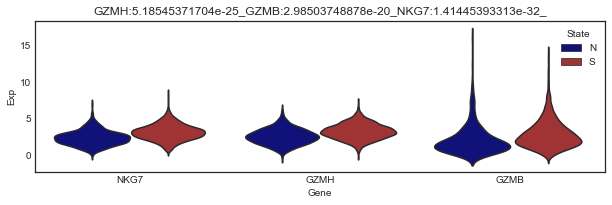

In [76]:
Cells=list(set(MetaDF[MetaDF['Celltype']=='TEMRA'].index).intersection(set(ZSAVER_DF.index)))
AllCells=Cells+Cells+Cells
DF=pd.DataFrame({'Gene':['GZMB']*len(Cells)+['GZMH']*len(Cells)+['NKG7']*len(Cells),'Exp':list(ZSAVER_DF.loc[Cells]['GZMB'])+list(ZSAVER_DF.loc[Cells]['GZMH'])+list(ZSAVER_DF.loc[Cells]['NKG7']),'State':list(MetaDF.loc[Cells]['State2'])*3},index=AllCells)                                       
ViolinPlot(DF.sort_values('State'),'Tct_cytotoxic_SAVER', 'Gene','Exp',hue='State',hueDict={'N':'darkblue','S':'firebrick'})



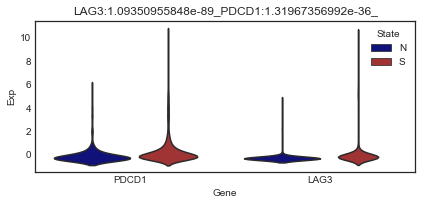

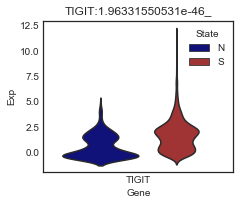

In [79]:
Cells=list(set(MetaDF[MetaDF['Celltype']=='Treg'].index).intersection(set(ZSAVER_DF.index)))
AllCells=Cells+Cells
DF=pd.DataFrame({'Gene':['PDCD1']*len(Cells)+['LAG3']*len(Cells),'Exp':list(ZSAVER_DF.loc[Cells]['PDCD1'])+list(ZSAVER_DF.loc[Cells]['LAG3']),'State':list(MetaDF.loc[Cells]['State2'])*2},index=AllCells)                                       
ViolinPlot(DF.sort_values('State'),'Treg_exhaustion_SAVER', 'Gene','Exp',hue='State',hueDict={'N':'darkblue','S':'firebrick'})

DF=pd.DataFrame({'Gene':['TIGIT']*len(Cells),'Exp':list(ZSAVER_DF.loc[Cells]['TIGIT']),'State':list(MetaDF.loc[Cells]['State2'])},index=Cells)                                       
ViolinPlot(DF.sort_values('State'),'Treg_TIGIT_SAVER', 'Gene','Exp',hue='State',hueDict={'N':'darkblue','S':'firebrick'})



# Gene signature signature score

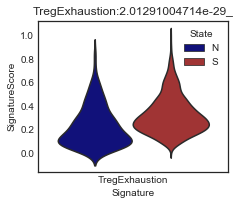

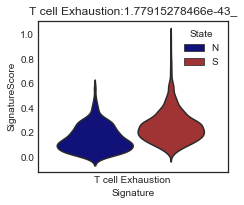

In [98]:
def Norm01(L):
    M=min(L)
    R=max(L)-M
    return [(i-M)/float(R) for i in L]


Cells=list(set(MetaDF[MetaDF['Celltype']=='Treg'].index).intersection(set(SAVER_DF.index)))
SignatureScoreDF=pd.DataFrame(SAVER_DF.T[Cells].loc[list(SignatureDF['Treg Exhaustion'].dropna())].dropna().apply(sum))
SignatureScoreDF['SignatureScore']=Norm01(SignatureScoreDF[0])
DF=pd.DataFrame({'Signature':['TregExhaustion']*len(Cells),'SignatureScore':SignatureScoreDF.loc[Cells]['SignatureScore'],'State':list(MetaDF.loc[Cells]['State2'])},index=Cells)                                       
ViolinPlot(DF.sort_values('State'),'Treg_TregExhaustion_SignatureScore_SumExp_Norm01_SAVER', 'Signature','SignatureScore',hue='State',hueDict={'N':'darkblue','S':'firebrick'})


SignatureScoreDF=pd.DataFrame(SAVER_DF.T[Cells].loc[list(SignatureDF['T cell Exhaustion'].dropna())].dropna().apply(sum))
SignatureScoreDF['SignatureScore']=Norm01(SignatureScoreDF[0])
DF=pd.DataFrame({'Signature':['T cell Exhaustion']*len(Cells),'SignatureScore':SignatureScoreDF.loc[Cells]['SignatureScore'],'State':list(MetaDF.loc[Cells]['State2'])},index=Cells)                                       
ViolinPlot(DF.sort_values('State'),'TcellExhaustion_SignatureScore_SumExp_Norm01_SAVER', 'Signature','SignatureScore',hue='State',hueDict={'N':'darkblue','S':'firebrick'})



### Differentially Expressed Genes

In [99]:
Dir=os.path.join(outDir,'Celltype_DiffGenes')
Mkdir(Dir)
Dir=os.path.join(Dir,'DiffGenes_Numbers')
Mkdir(Dir)



In [137]:
SAVER_DF=SAVER_DF.T[SAVER_DF.apply(max,axis=0)>1].T
ZSAVER_DF=ZSAVER_DF[SAVER_DF.columns]



In [143]:
import collections
import itertools
def  GetDiffGenes(diff=0.4,fdr=0.05,hue='Celltype',CelltypeOrder=['TN','TC','Treg','Th2','Th17','Th1','TEMRA','Undefined']):       
    
    UP=[]
    Down=[]
    Down_Dict={}
    UP_Dict={}

    Diff_DF=pd.DataFrame({},columns=CelltypeOrder,index=ZSAVER_DF.columns)
    FDR_DF=pd.DataFrame({},columns=CelltypeOrder,index=ZSAVER_DF.columns)
    for i in CelltypeOrder:
            Cluster_N=ZSAVER_DF.loc[list(MetaDF[(MetaDF[hue]==i)&(MetaDF['State2']=='N')].index)].dropna()
            Cluster_P=ZSAVER_DF.loc[list(MetaDF[(MetaDF[hue]==i)&(MetaDF['State2']=='S')].index)].dropna()
        
            Cluster_N2=SAVER_DF.loc[list(MetaDF[(MetaDF[hue]==i)&(MetaDF['State2']=='N')].index)].dropna()
            Cluster_P2=SAVER_DF.loc[list(MetaDF[(MetaDF[hue]==i)&(MetaDF['State2']=='S')].index)].dropna()
        
            MNMean=Cluster_N2.apply(np.mean,axis=0)
            MPMean=Cluster_P2.apply(np.mean,axis=0)
            MN=Cluster_N.apply(np.mean,axis=0)
            MP=Cluster_P.apply(np.mean,axis=0)
            
            P_Val=[]
            for g in list(Cluster_N):
                try:
                    _,p=scipy.stats.mannwhitneyu(Cluster_N[g],Cluster_P[g])
                except ValueError:
                    p=1
                P_Val.append(p)
            Q_Val=pd.Series(p_adjust_bh(P_Val),index=list(Cluster_N))
        
            up=(MP-MN>diff)&(MPMean>0.1)&(Q_Val<fdr)&(MP>0.1)
            down=(MN-MP>diff)&(MNMean>0.1)&(Q_Val<fdr)&(MN>0.1)
            UP.append(sum(up))
            Down.append(sum(down))
            UP_Dict[i]=list(MN[up].index)
            Down_Dict[i]=list(MN[down].index)
            Diff_DF[i]=[(MP-MN)[g] if (max([MPMean[g],MNMean[g]])>0.1) else 0 for g in list(Diff_DF.index)]                 
            FDR_DF[i]=Q_Val
    NumDF=pd.DataFrame({'Down':Down,'UP':UP},index=CelltypeOrder)
    return NumDF,Down_Dict,UP_Dict,Diff_DF




In [144]:
NumDF_1,Down_Dict_1,UP_Dict_1,_=GetDiffGenes(diff=0.1)
NumDF_2,Down_Dict_2,UP_Dict_2,_=GetDiffGenes(diff=0.2)
NumDF_3,Down_Dict_3,UP_Dict_3,_=GetDiffGenes(diff=0.3)
NumDF_4,Down_Dict_4,UP_Dict_4,_=GetDiffGenes(diff=0.4)
NumDF_5,Down_Dict_5,UP_Dict_5,_=GetDiffGenes(diff=0.5)
NumDF_6,Down_Dict_6,UP_Dict_6,_=GetDiffGenes(diff=0.6)
NumDF_7,Down_Dict_7,UP_Dict_7,_=GetDiffGenes(diff=0.7)
NumDF_8,Down_Dict_8,UP_Dict_8,_=GetDiffGenes(diff=0.8)
NumDF_9,Down_Dict_9,UP_Dict_9,_=GetDiffGenes(diff=0.9)
NumDF_10,Down_Dict_10,UP_Dict_10,Diff_DF=GetDiffGenes(diff=1)



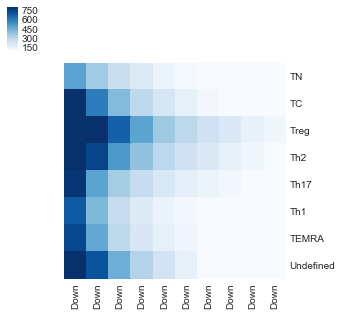

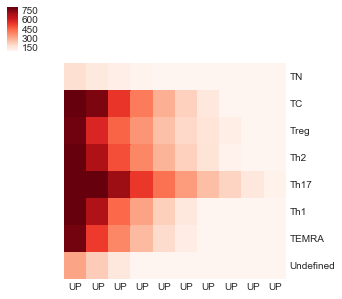

In [145]:
DownDF=pd.concat([NumDF_1[['Down']],NumDF_2[['Down']],NumDF_3[['Down']],NumDF_4[['Down']],NumDF_5[['Down']],NumDF_6[['Down']],NumDF_7[['Down']],NumDF_8[['Down']],NumDF_9[['Down']],NumDF_10[['Down']]],axis=1)                                   
UpDF=pd.concat([NumDF_1[['UP']],NumDF_2[['UP']],NumDF_3[['UP']],NumDF_4[['UP']],NumDF_5[['UP']],NumDF_6[['UP']],NumDF_7[['UP']],NumDF_8[['UP']],NumDF_9[['UP']],NumDF_10[['UP']]],axis=1)

fig1=sns.clustermap(DownDF,figsize=(5,5),vmax=800,vmin=100,cmap='Blues',col_cluster=False,row_cluster=False)
fig1.savefig(os.path.join(Dir,'Num_of_DownRegulatedGenes.pdf'))
SaveTable(DownDF,os.path.join(Dir,'Num_of_DownRegulatedGenes.txt'))

fig1=sns.clustermap(UpDF,figsize=(5,5),vmax=800,vmin=100,cmap='Reds',col_cluster=False,row_cluster=False)
fig1.savefig(os.path.join(Dir,'Num_of_UpRegulatedGenes.pdf'))
plt.show()
SaveTable(UpDF,os.path.join(Dir,'Num_of_UpRegulatedGenes.txt'))


Num
1    593
2    315
3    257
4    185
5    175
6    179
7    237
8     85
Name: N, dtype: int64


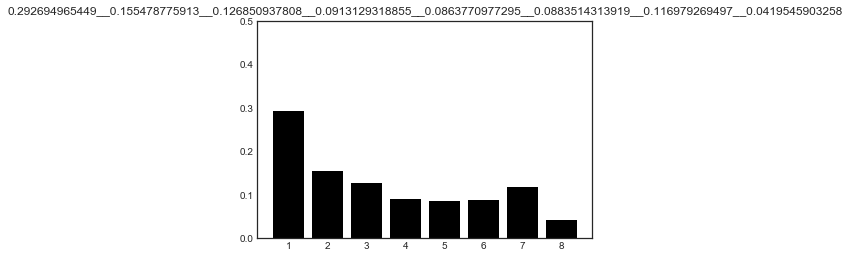

Num
1    468
2    200
3    182
4    108
5    128
6    117
7    137
8     75
Name: N, dtype: int64


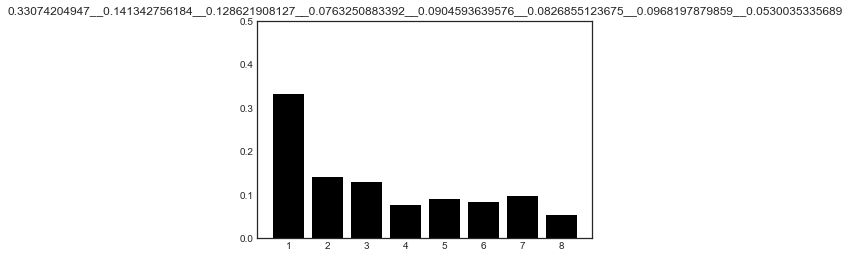

Num
1    302
2    114
3    120
4     59
5     86
6     79
7     93
8     66
Name: N, dtype: int64


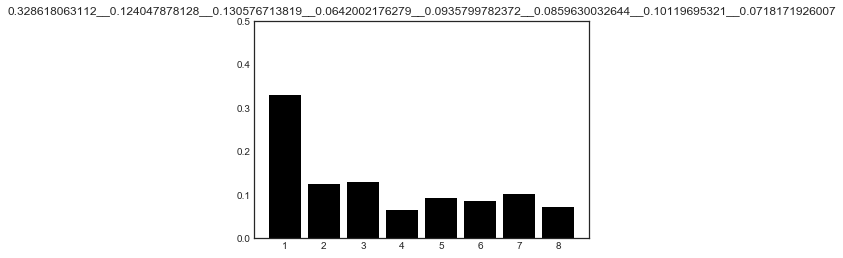

Num
1    190
2     87
3     73
4     55
5     56
6     72
7     60
8     51
Name: N, dtype: int64


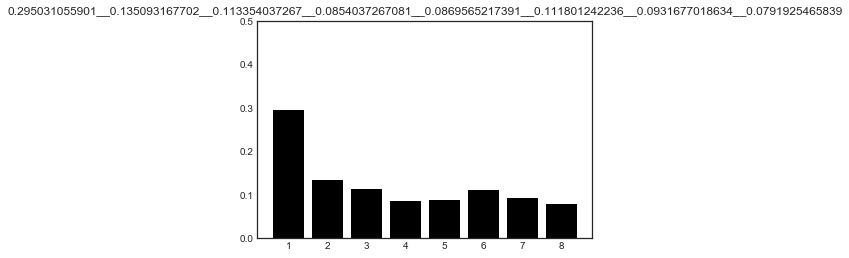

Num
1    133
2     64
3     66
4     36
5     44
6     54
7     42
8     40
Name: N, dtype: int64


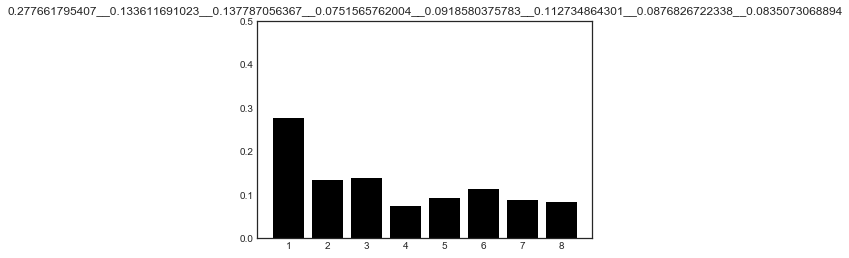

Num
1    119
2     59
3     42
4     25
5     34
6     37
7     34
8     34
Name: N, dtype: int64


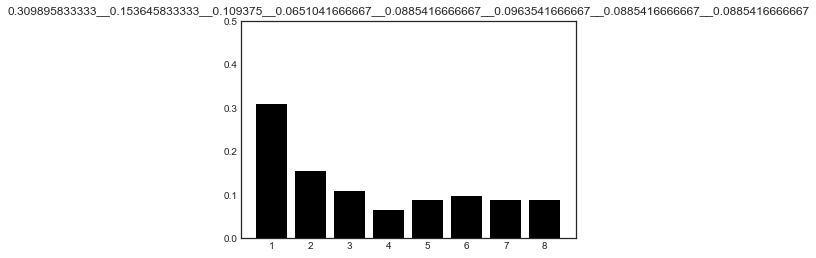

Num
1    108
2     51
3     31
4     32
5     22
6     21
7     29
8     25
Name: N, dtype: int64


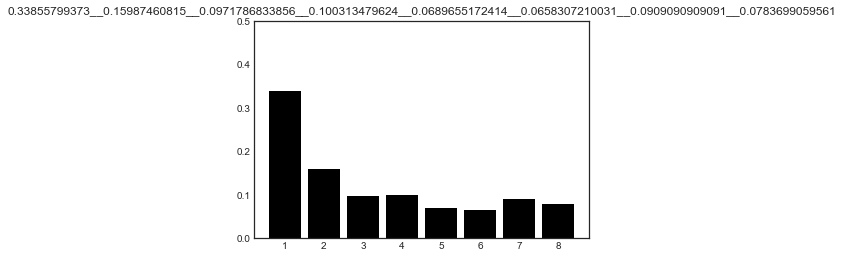

Num
1    88
2    39
3    36
4    25
5    17
6    13
7    23
8    16
Name: N, dtype: int64


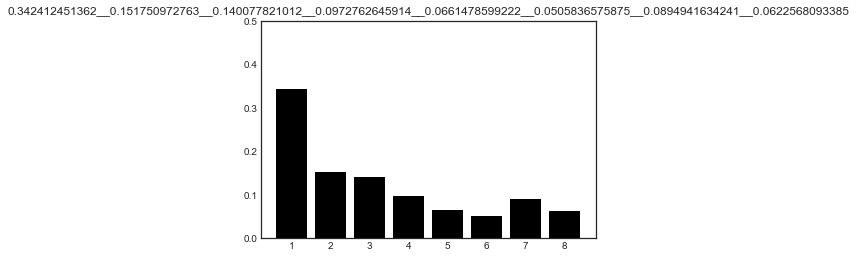

Num
1    69
2    46
3    31
4    22
5     8
6    11
7    15
8     7
Name: N, dtype: int64


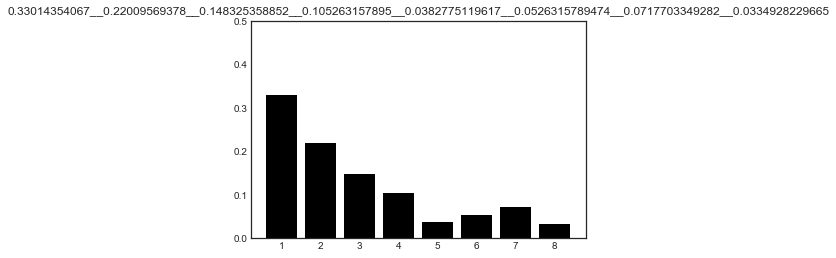

Num
1    65
2    27
3    30
4    12
5    11
6     6
7    10
8     3
Name: N, dtype: int64


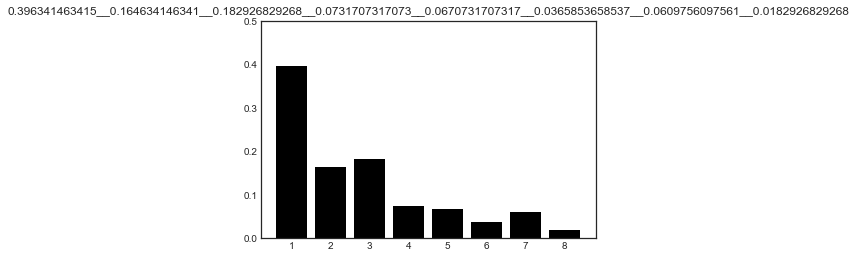

Num
1    400
2    306
3    197
4    206
5    204
6    363
7    120
8      2
Name: N, dtype: int64


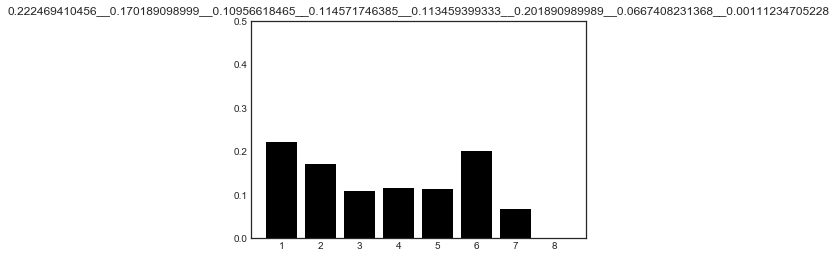

Num
1    296
2    185
3    155
4    143
5    139
6    270
7     88
8      2
Name: N, dtype: int64


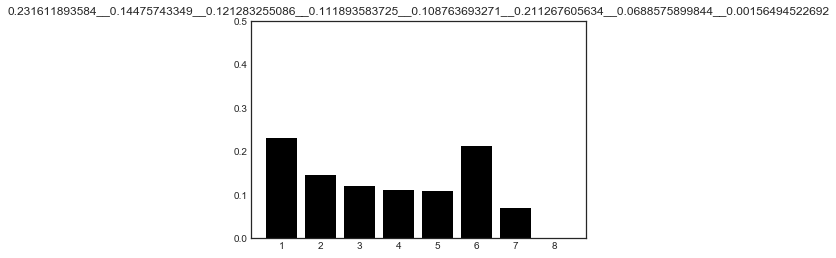

Num
1    223
2    146
3     88
4     92
5    101
6    209
7     63
8      2
Name: N, dtype: int64


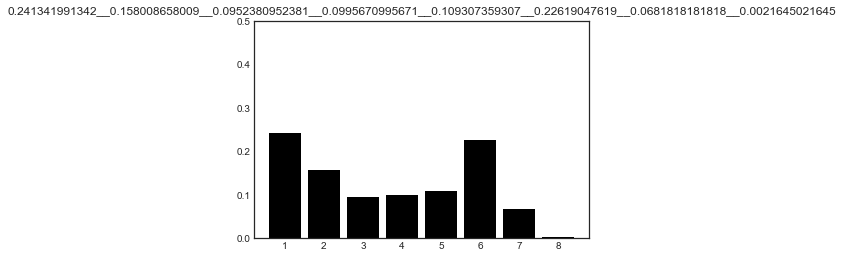

Num
1    162
2     97
3     76
4     71
5     84
6    153
7     42
8      2
Name: N, dtype: int64


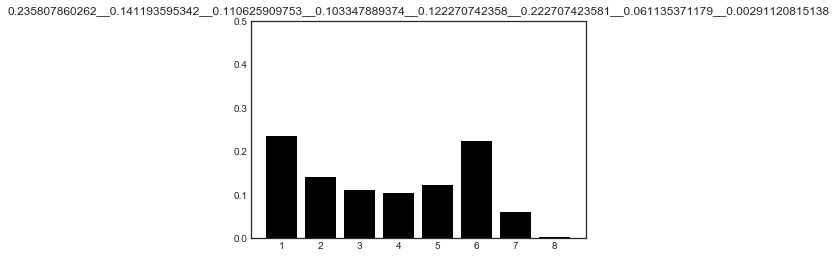

Num
1    149
2     81
3     64
4     52
5     57
6    108
7     30
8      1
Name: N, dtype: int64


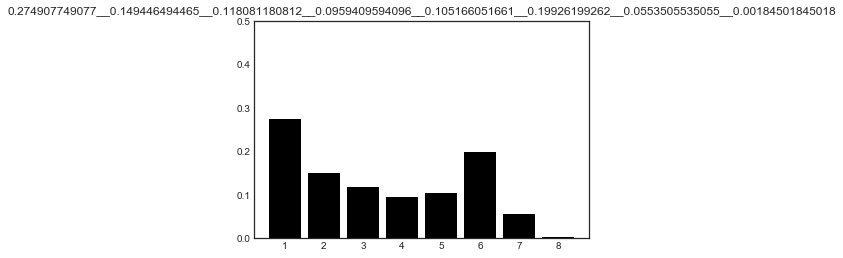

Num
1    110
2     76
3     46
4     45
5     51
6     68
7     20
8      1
Name: N, dtype: int64


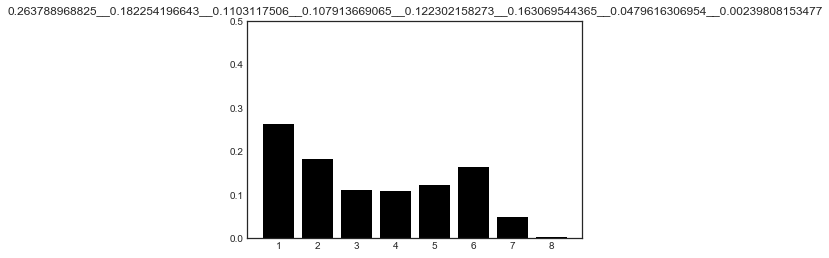

Num
1    97
2    67
3    44
4    42
5    27
6    42
7    17
Name: N, dtype: int64


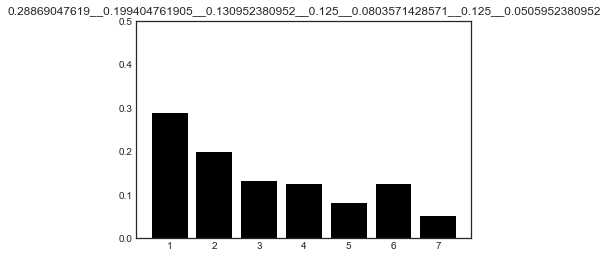

Num
1    88
2    56
3    35
4    26
5    17
6    28
7    11
Name: N, dtype: int64


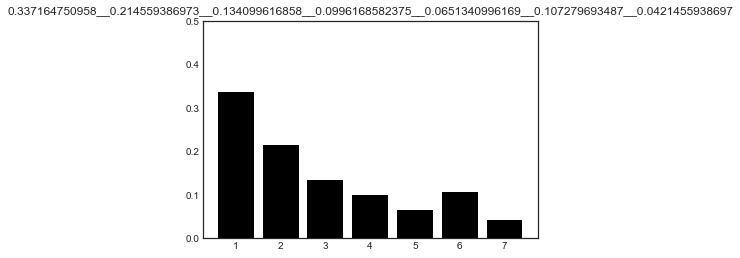

Num
1    81
2    39
3    24
4    20
5    12
6    17
7     6
Name: N, dtype: int64


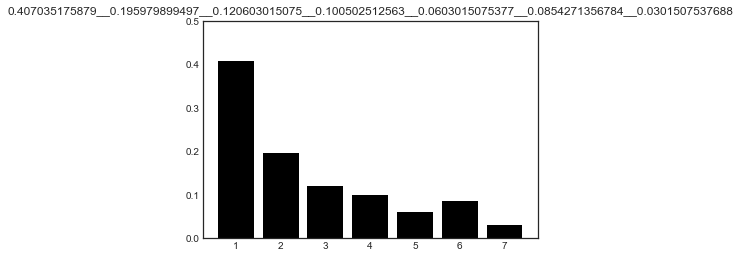

Num
1    69
2    22
3    20
4    14
5     7
6     6
7     4
Name: N, dtype: int64


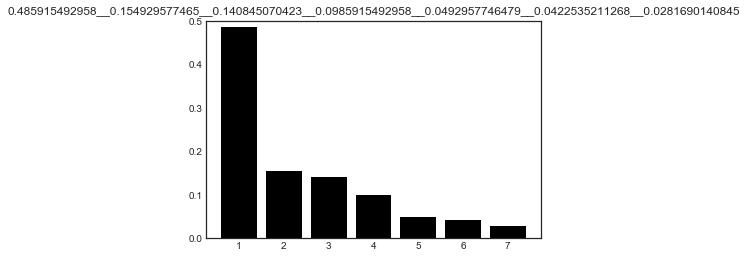

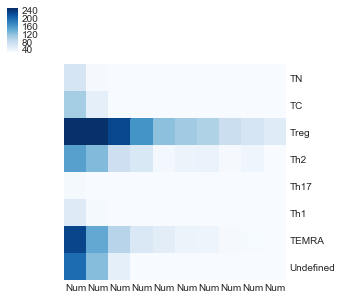

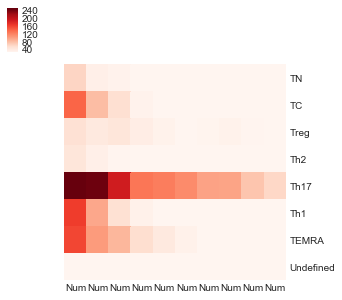

In [146]:

def CelltypeSpecificDiffGenes(Dict,Dir,label):
    Genes=[i for i,_ in itertools.groupby(sorted(flatten(Dict.values())))]
    Nums=[len(list(k)) for _,k in itertools.groupby(sorted(flatten(Dict.values())))]
    GenesRepNum=pd.DataFrame({'Num':Nums}, index=Genes)
    GenesRepNum['N']=[1]*len(GenesRepNum)
    
    Count_Dict=GenesRepNum.groupby('Num')['N'].apply(sum)
    print Count_Dict
    plt.bar(list(Count_Dict.index),[Count_Dict[i]/float(len(GenesRepNum.index)) for i in list(Count_Dict.index)],color='k')    
    plt.title('__'.join([str(Count_Dict[i]/float(len(GenesRepNum.index))) for i in list(Count_Dict.index)]))
    plt.ylim([0,0.5])
    plt.xticks(list(Count_Dict.index),list(Count_Dict.index))
    plt.savefig(os.path.join(Dir,'{}.CelltypeGeneCount_Barplot.pdf'.format(label)))
    plt.show()

    Dict_Common={}
    Dict_Specific={}
    for ct in Dict:
        Dict_Common[ct]=[i for i in Dict[ct] if i in list(GenesRepNum[GenesRepNum['Num']>5].index)]
        Dict_Specific[ct]=[i for i in Dict[ct] if i in list(GenesRepNum[GenesRepNum['Num']<3].index)]
    return Dict_Common,Dict_Specific

def Dict2DF(Dict):return pd.DataFrame({'Num':[len(Dict[i]) for i in CelltypeOrder]}, index=CelltypeOrder)
    
    
CelltypeOrder=['TN','TC','Treg','Th2','Th17','Th1','TEMRA','Undefined']
DownDict_Common1,DownDict_Specific1= CelltypeSpecificDiffGenes(Down_Dict_1,Dir,'DownGenes.Diff_0.1')
DownDict_Common2,DownDict_Specific2= CelltypeSpecificDiffGenes(Down_Dict_2,Dir,'DownGenes.Diff_0.2')
DownDict_Common3,DownDict_Specific3= CelltypeSpecificDiffGenes(Down_Dict_3,Dir,'DownGenes.Diff_0.3')
DownDict_Common4,DownDict_Specific4= CelltypeSpecificDiffGenes(Down_Dict_4,Dir,'DownGenes.Diff_0.4')
DownDict_Common5,DownDict_Specific5= CelltypeSpecificDiffGenes(Down_Dict_5,Dir,'DownGenes.Diff_0.5')
DownDict_Common6,DownDict_Specific6= CelltypeSpecificDiffGenes(Down_Dict_6,Dir,'DownGenes.Diff_0.6')
DownDict_Common7,DownDict_Specific7= CelltypeSpecificDiffGenes(Down_Dict_7,Dir,'DownGenes.Diff_0.7')
DownDict_Common8,DownDict_Specific8= CelltypeSpecificDiffGenes(Down_Dict_8,Dir,'DownGenes.Diff_0.8')
DownDict_Common9,DownDict_Specific9= CelltypeSpecificDiffGenes(Down_Dict_9,Dir,'DownGenes.Diff_0.9')
DownDict_Common10,DownDict_Specific10= CelltypeSpecificDiffGenes(Down_Dict_10,Dir,'DownGenes.Diff_1')

UpDict_Common1,UpDict_Specific1= CelltypeSpecificDiffGenes(UP_Dict_1,Dir,'UpGenes.Diff_0.1')
UpDict_Common2,UpDict_Specific2= CelltypeSpecificDiffGenes(UP_Dict_2,Dir,'UpGenes.Diff_0.2')
UpDict_Common3,UpDict_Specific3= CelltypeSpecificDiffGenes(UP_Dict_3,Dir,'UpGenes.Diff_0.3')
UpDict_Common4,UpDict_Specific4= CelltypeSpecificDiffGenes(UP_Dict_4,Dir,'UpGenes.Diff_0.4')
UpDict_Common5,UpDict_Specific5= CelltypeSpecificDiffGenes(UP_Dict_5,Dir,'UpGenes.Diff_0.5')
UpDict_Common6,UpDict_Specific6= CelltypeSpecificDiffGenes(UP_Dict_6,Dir,'UpGenes.Diff_0.6')
UpDict_Common7,UpDict_Specific7= CelltypeSpecificDiffGenes(UP_Dict_7,Dir,'UpGenes.Diff_0.7')
UpDict_Common8,UpDict_Specific8= CelltypeSpecificDiffGenes(UP_Dict_8,Dir,'UpGenes.Diff_0.8')
UpDict_Common9,UpDict_Specific9= CelltypeSpecificDiffGenes(UP_Dict_9,Dir,'UpGenes.Diff_0.9')
UpDict_Common10,UpDict_Specific10= CelltypeSpecificDiffGenes(UP_Dict_10,Dir,'UpGenes.Diff_1')

DownDF_Specific=pd.concat([Dict2DF(d) for d in [DownDict_Specific1,DownDict_Specific2,DownDict_Specific3,DownDict_Specific4,DownDict_Specific5,DownDict_Specific6,DownDict_Specific7,DownDict_Specific8,DownDict_Specific9,DownDict_Specific10]],axis=1)                                   
UpDF_Specific=pd.concat([Dict2DF(d) for d in [UpDict_Specific1,UpDict_Specific2,UpDict_Specific3,UpDict_Specific4,UpDict_Specific5,UpDict_Specific6,UpDict_Specific7,UpDict_Specific8,UpDict_Specific9,UpDict_Specific10]],axis=1)  

fig1=sns.clustermap(DownDF_Specific,figsize=(5,5),vmax=250,vmin=30,cmap='Blues',col_cluster=False,row_cluster=False)
fig1.savefig(os.path.join(Dir,'Num_of_SpecificDownRegulatedGenes.pdf'))
SaveTable(DownDF_Specific,os.path.join(Dir,'Num_of_SpecificDownRegulatedGenes.txt'))

fig1=sns.clustermap(UpDF_Specific,figsize=(5,5),vmax=250,vmin=30,cmap='Reds',col_cluster=False,row_cluster=False)
fig1.savefig(os.path.join(Dir,'Num_of_SpecificUpRegulatedGenes.pdf'))
plt.show()
SaveTable(UpDF_Specific,os.path.join(Dir,'Num_of_SpecificUpRegulatedGenes.txt'))



In [161]:
len(set(UP_Dict_4['TEMRA']+UP_Dict_4['Undefined']+UP_Dict_4['Th2']+UP_Dict_4['Th1']+UP_Dict_4['TN']+UP_Dict_4['Th17']+UP_Dict_4['Treg']+UP_Dict_4['TC']))                       
 
    

687

In [162]:
len(set(Down_Dict_4['TEMRA']+Down_Dict_4['Undefined']+Down_Dict_4['Th2']+Down_Dict_4['Th1']+Down_Dict_4['TN']+Down_Dict_4['Th17']+Down_Dict_4['Treg']+Down_Dict_4['TC']))                       
 

644

In [163]:
687+644

1331

In [164]:
len(set(UpDict_Common4['TEMRA']+UpDict_Common4['Undefined']+UpDict_Common4['Th2']+UpDict_Common4['Th1']+UpDict_Common4['TN']+UpDict_Common4['Th17']+UpDict_Common4['Treg']+UpDict_Common4['TC']))                        


197

In [166]:
197/687.0

0.2867540029112082

In [167]:
len(set(DownDict_Common4['TEMRA']+DownDict_Common4['Undefined']+DownDict_Common4['Th2']+DownDict_Common4['Th1']+DownDict_Common4['TN']+DownDict_Common4['Th17']+DownDict_Common4['Treg']+DownDict_Common4['TC']))                        


183

In [169]:
183/644.0

0.2841614906832298

In [170]:
len(set(UpDict_Specific4['TEMRA']+UpDict_Specific4['Undefined']+UpDict_Specific4['Th2']+UpDict_Specific4['Th1']+UpDict_Specific4['TN']+UpDict_Specific4['Th17']+UpDict_Specific4['Treg']+UpDict_Specific4['TC']))             


259

In [172]:
259/687.0

0.37700145560407566

In [173]:
len(set(DownDict_Specific4['TEMRA']+DownDict_Specific4['Undefined']+DownDict_Specific4['Th2']+DownDict_Specific4['Th1']+DownDict_Specific4['TN']+DownDict_Specific4['Th17']+DownDict_Specific4['Treg']+DownDict_Specific4['TC']))             


277

In [174]:
277/644.0

0.4301242236024845

#### cutoff=0.4

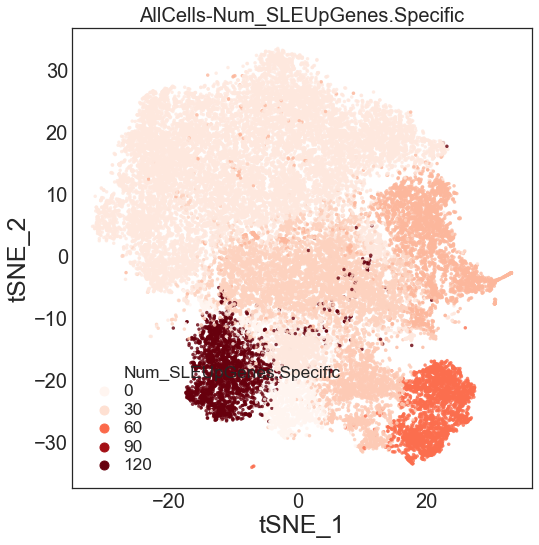

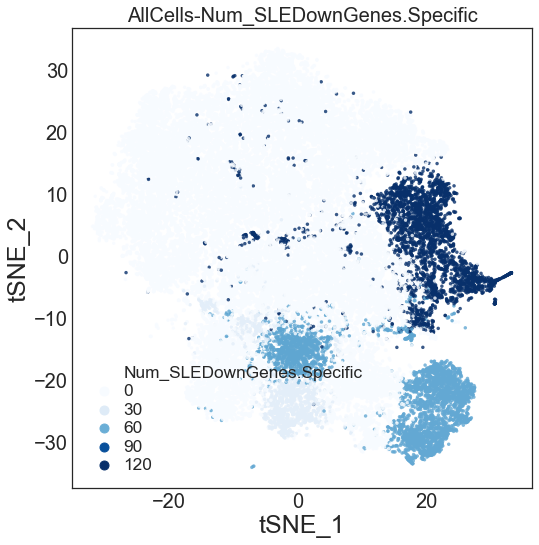

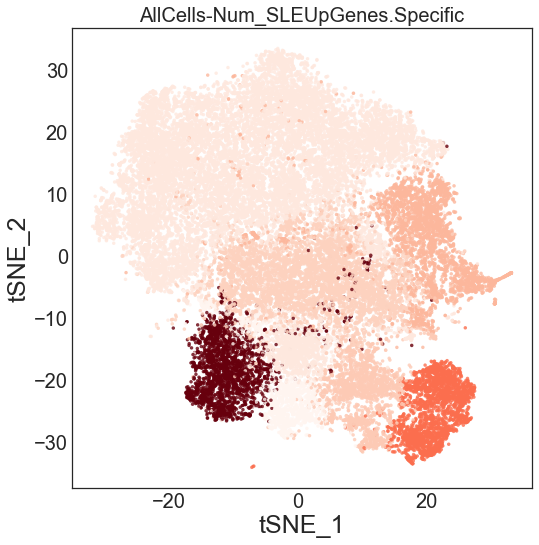

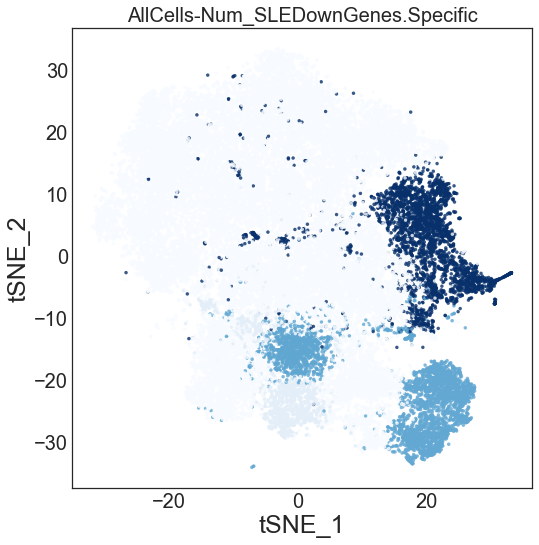

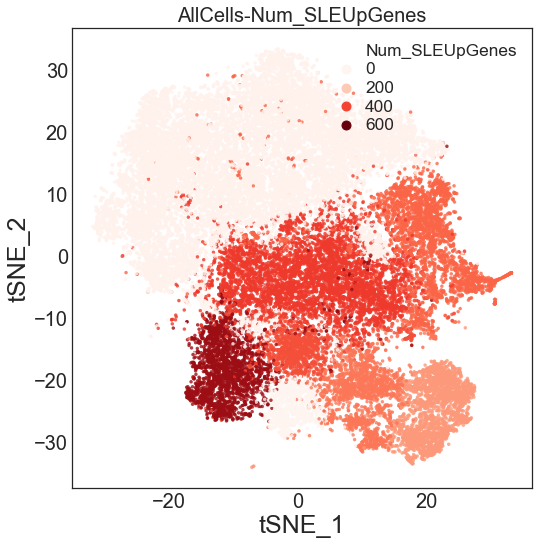

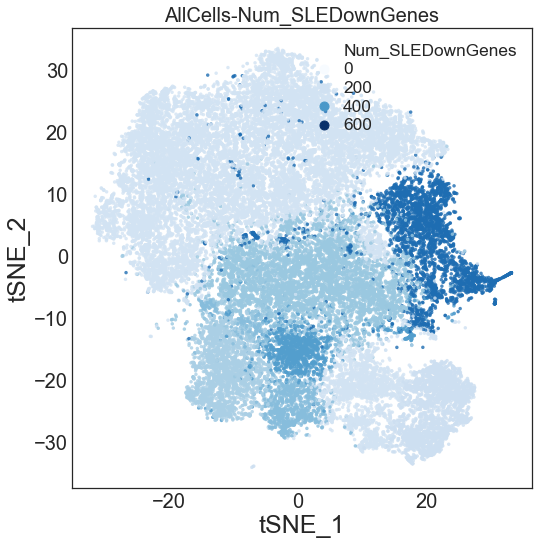

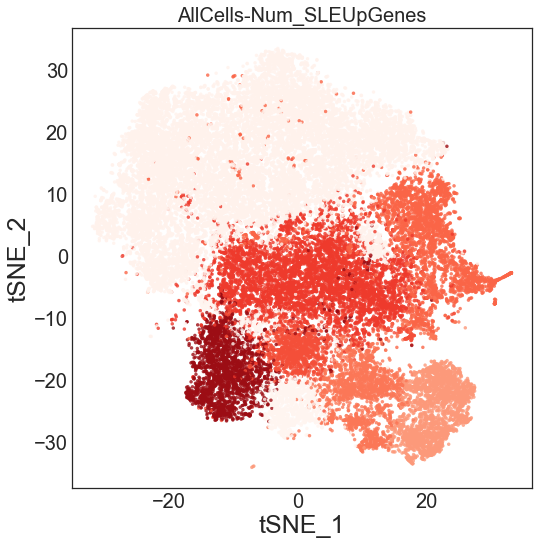

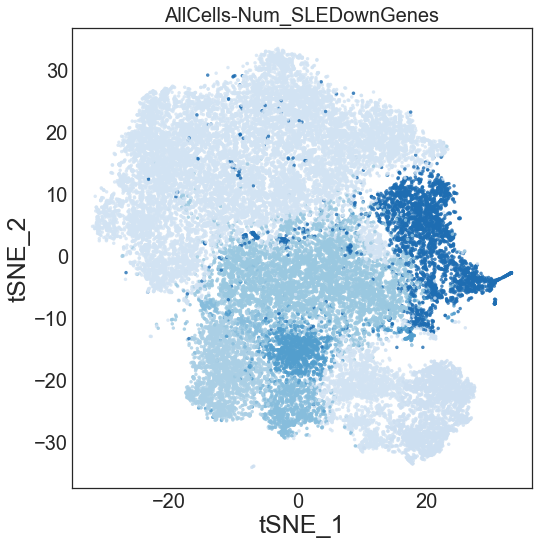

In [183]:
MetaDF=MetaDF[MetaDF['Celltype']!='Low Genes']
MetaDF['Num_SLEUpGenes']=[NumDF_4['UP'][i] for i in MetaDF['Celltype']]
MetaDF['Num_SLEDownGenes']=[NumDF_4['Down'][i] for i in MetaDF['Celltype']]

MetaDF['Num_SLEUpGenes.Specific']=[len(UpDict_Specific4[i]) for i in MetaDF['Celltype']]
MetaDF['Num_SLEDownGenes.Specific']=[len(DownDict_Specific4[i]) for i in MetaDF['Celltype']]

outFilePrefix_DEG=os.path.join(Dir,'DiffCutoff.0.4')

Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEUpGenes.Specific',hueColorDict='Reds',vmin=20,vmax=100,outFilePrefix=outFilePrefix_DEG,legend=True)
Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEDownGenes.Specific',hueColorDict='Blues',vmin=20,vmax=100,outFilePrefix=outFilePrefix_DEG,legend=True)
Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEUpGenes.Specific',hueColorDict='Reds',vmin=20,vmax=100,outFilePrefix=outFilePrefix_DEG,legend=False)
Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEDownGenes.Specific',hueColorDict='Blues',vmin=20,vmax=100,outFilePrefix=outFilePrefix_DEG,legend=False)

Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEUpGenes',hueColorDict='Reds',vmin=100,vmax=600,outFilePrefix=outFilePrefix_DEG,legend=True)
Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEDownGenes',hueColorDict='Blues',vmin=100,vmax=600,outFilePrefix=outFilePrefix_DEG,legend=True)
Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEUpGenes',hueColorDict='Reds',vmin=100,vmax=600,outFilePrefix=outFilePrefix_DEG,legend=False)
Scatter(ScatterDF=MetaDF,X='tSNE_1',Y='tSNE_2',hue='Num_SLEDownGenes',hueColorDict='Blues',vmin=100,vmax=600,outFilePrefix=outFilePrefix_DEG,legend=False)



### DEGs Diff Heatmap

In [184]:
Dir=os.path.join(outDir,'Celltype_DiffGenes')
Mkdir(Dir)
Dir=os.path.join(Dir,'DiffGenes_DiffExp')
Mkdir(Dir)


In [185]:
UpDEGs_Common=list(set(flatten(UpDict_Common4.values())))
DownDEGs_Common=list(set(flatten(DownDict_Common4.values())))

UpDEGs_Specific=list(set(flatten(UpDict_Specific4.values())))
DownDEGs_Specific=list(set(flatten(DownDict_Specific4.values())))

def Heatmap(DF,Dir,label,cmap):
    fig=sns.clustermap(DF, figsize=(4,0.25*len(DF.index)), cmap=cmap,vmax=0.7,vmin=0.3,col_cluster=False, metric='correlation', method='average')                
    fig.savefig(os.path.join(Dir,label+'.DEGs.DiffExp.pdf'))
    plt.show()
    print len(DF)
    SaveTable(DF, os.path.join(Dir,label+'.DEGs.DiffExp.txt'))
    
    

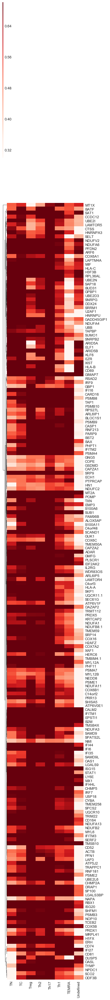

197


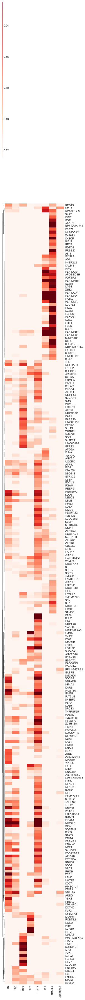

259


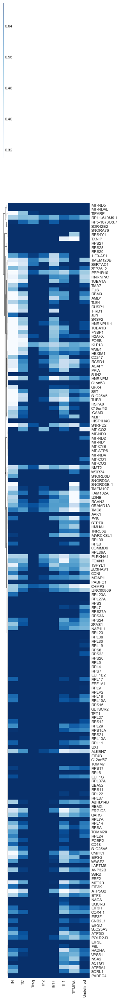

183


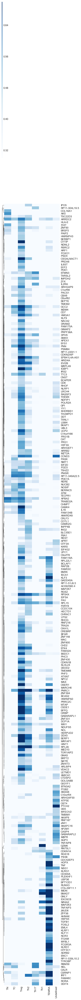

277


In [186]:
Heatmap(Diff_DF.loc[UpDEGs_Common],Dir,'DiffExp_UpDEGs_Common','Reds')
Heatmap(Diff_DF.loc[UpDEGs_Specific],Dir,'DiffExp_UpDEGs_Specific','Reds')

Heatmap(abs(Diff_DF.loc[DownDEGs_Common]),Dir,'DiffExp_DownDEGs_Common','Blues')
Heatmap(abs(Diff_DF.loc[DownDEGs_Specific]),Dir,'DiffExp_DownDEGs_Specific','Blues')



# Function annotation for Differentially Expressed Genes

In [241]:
Dir=os.path.join(outDir,'Celltype_DiffGenes')
Mkdir(Dir)
Dir=os.path.join(Dir,'DiffGenes_Functions')
Mkdir(Dir)
Dir=os.path.join(Dir,'Genomica')
Mkdir(Dir)


In [ ]:
def Geneset_Gene_Table(Signature,DF,label,Dir):
    SignatureDF=ReadTable(Signature)
    Table=pd.DataFrame({},index=DF.index)
    for gs in list(SignatureDF):
        Table[gs]=[1 if i in list(SignatureDF[gs]) else 0 for i in DF.index ]
    dDir=os.path.join(Dir, label)
    Mkdir(dDir)
    SaveTable(Table, os.path.join(dDir,'Tables_0_1.tab'))
    return Table


In [ ]:
#Get input file of genomica
AllDiffGenes=list(Diff_DF[abs(Diff_DF).apply(max,axis=1)>0.0].index)
DEGs_Diff_DF=Diff_DF.loc[AllDiffGenes]
Table_MSig=Geneset_Gene_Table(Signature,DEGs_Diff_DF,'ManuSelectedGene_Signatures',Dir)
Table_Sig=Geneset_Gene_Table(Signature_MSig,DEGs_Diff_DF,'MSigDB_Signatures',Dir)

DEGs_Diff_DF['Weight']=[1]*len(DEGs_Diff_DF)
DEGs_Diff_DF=DEGs_Diff_DF[['Weight']+list(DEGs_Diff_DF)[:-1]]
SaveTable(DEGs_Diff_DF, os.path.join(Dir,'DEGs_Diff_DF.txt'))


### Results

In [244]:

MSigDF=ReadTable(os.path.join(inDir,'MSigDB_Signatures_Enrichment.gxr.txt'))                                
ManuDF=ReadTable(os.path.join(inDir,'ManuSelectedGene_Signatures.Enrichment.gxr.txt'))



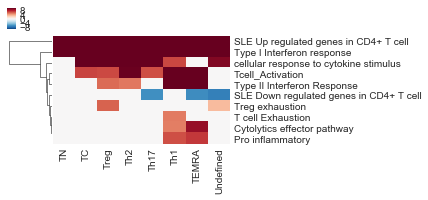

In [246]:
fig=sns.clustermap(ManuDF,figsize=(4,0.25*len(ManuDF)),col_cluster=False, cmap='RdBu_r',yticklabels=list(ManuDF.index),vmin=-10,vmax=10)
plt.show()
fig.savefig(os.path.join(Dir,'ManuSelectedGene_Signatures_Function_Enrichment.pdf'))


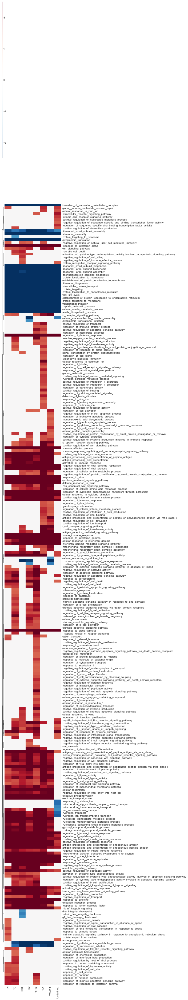

In [247]:
fig=sns.clustermap(MSigDF,figsize=(4,0.25*len(MSigDF)),metric='correlation',col_cluster=False, cmap='RdBu_r',yticklabels=list(MSigDF.index),vmin=-10,vmax=10)                     
plt.show()
fig.savefig(os.path.join(Dir,'MSigDB_Signatures_Function_Enrichment.pdf'))



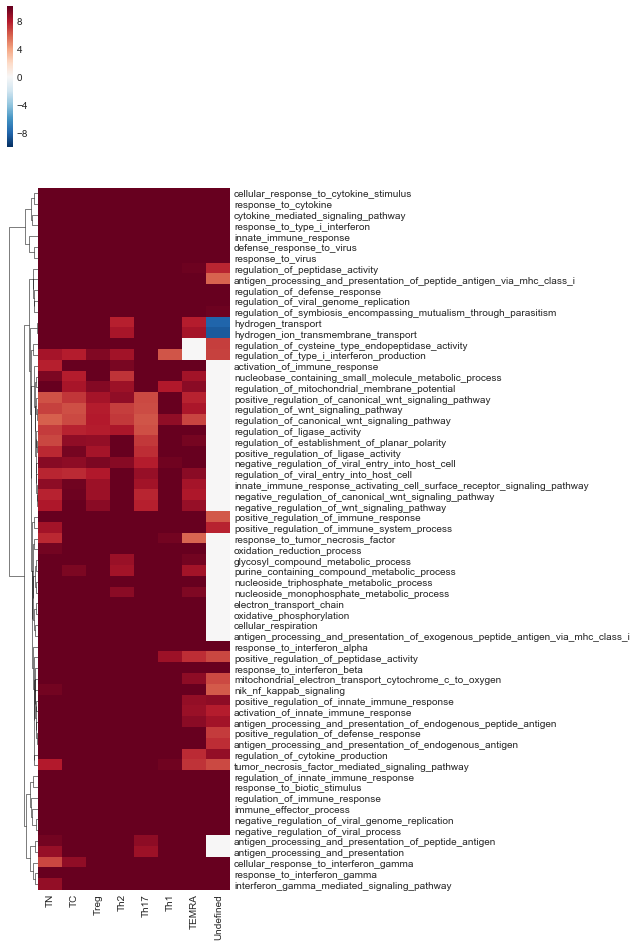

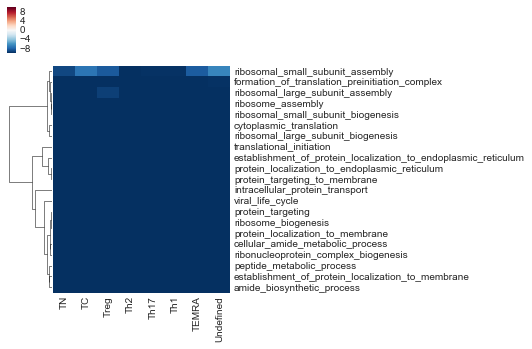

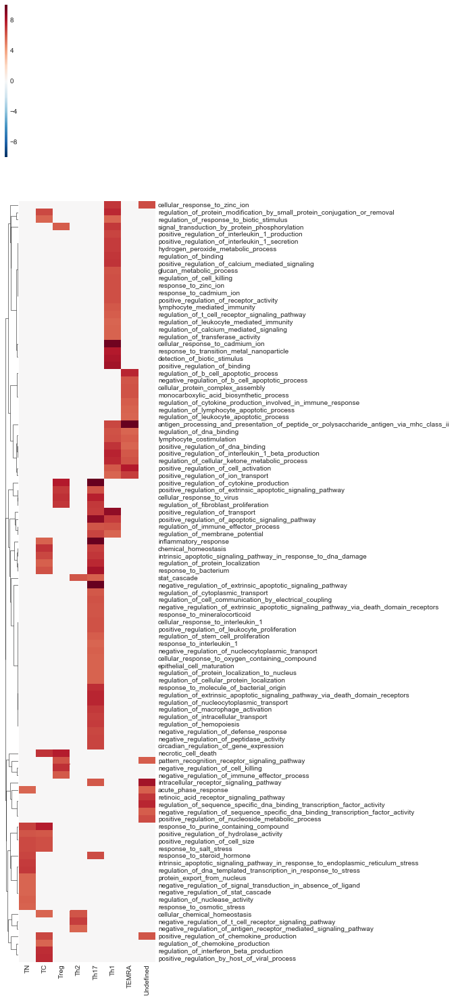

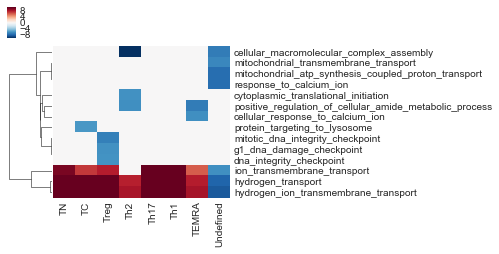

In [251]:
MSigDF_NumUp=(MSigDF>2).apply(sum,axis=1)
MSigDF_NumDown=(MSigDF<-2).apply(sum,axis=1)

CommonUp=MSigDF.loc[list(MSigDF_NumUp[MSigDF_NumUp>6].index)]
CommonDown=MSigDF.loc[list(MSigDF_NumDown[MSigDF_NumDown>6].index)]

SpecificUp=MSigDF.loc[list(MSigDF_NumUp[(MSigDF_NumUp<3)&(MSigDF_NumUp>0) ].index)]
SpecificDown=MSigDF.loc[list(MSigDF_NumDown[(MSigDF_NumDown<3)&(MSigDF_NumDown>0)].index)]

def Heatmap(DF,Dir,label):
    fig=sns.clustermap(DF,figsize=(4,0.25*len(DF)),cmap='RdBu_r',col_cluster=False,vmax=10,vmin=-10,yticklabels=DF.index)
    fig.savefig(os.path.join(Dir,label+'Clustermap.pdf'))
    plt.show()
    SaveTable(DF,os.path.join(Dir,label+'Clustermap.txt'))
    return
   
Heatmap(CommonUp,Dir,'MSigDB_Signatures_CommonUp')
Heatmap(CommonDown,Dir,'MSigDB_Signatures_CommonDown')

Heatmap(SpecificUp,Dir,'MSigDB_Signatures_SpecificUp')
Heatmap(SpecificDown,Dir,'MSigDB_Signatures_SpecificDown')




In [ ]:
#Treg Expression 

In [259]:

SaveTable(Seurat_DF.loc[MetaDF[MetaDF['Celltype']=='Treg'].index],"./scRNA-seq/SourceData/Treg/Treg.Aggr3.dataNorm.txt")                         
SaveTable(SAVER_DF.loc[MetaDF[MetaDF['Celltype']=='Treg'].index],"./scRNA-seq/SourceData/Treg/Treg.Aggr3.dataSAVER.txt")                         
SaveTable(MetaDF[MetaDF['Celltype']=='Treg'],"./scRNA-seq/SourceData/Treg/Treg.MetaData.txt")    

